# Imports

In [1]:
from pandas import read_csv
from matplotlib import pyplot as plt
import sys
import numpy as np
import pandas as pd
from datetime import datetime

from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow.keras import layers
from keras.optimizers import Adam
from keras.layers import MaxPooling2D,Activation, Dense
from tensorflow import Tensor
from tensorflow.keras.layers import Input, Conv1D, Conv2D, ReLU, BatchNormalization,\
                                    Add, AveragePooling2D, Flatten, Dense,Dropout,LSTM,TimeDistributed,\
                                    MaxPooling1D,Flatten
from tensorflow.keras.models import Model
from keras.models import Sequential
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Variáveis Globais

In [3]:
file_path = "/content/drive/MyDrive/TeseSmartwatch/Exercicio"

users1=["AntonioC","GusC","DarC"]

repetition=["R1","R2","R3","R4"]

pesos=["3kg","5kg"]

# Funções Definidas

In [4]:
def getMedian(vs):
    if (len(vs)==0):
        return 0
    return (np.median(vs))

In [8]:
def getMatrix(exer, file_path, users1,repetition, pesos):
        X = []
        Y = []
        CV_Pesos = []
        CV_Utilizadores = []
        CV_Repeticao = []
        CV_Individual = []
        Contagem = 0
        tW=list(np.arange(-2.5,2.5+0.125,0.1))
        tStep=0.1
        for ixa,ps in enumerate(pesos):
                for ixu,us in enumerate(users1):
                    for ixc,cl in enumerate(repetition):
                        print("Scene ", Contagem)
                        print("the user user is ",us," try nº ",cl," peso: ",ps)
                        data_input = pd.read_csv(file_path+exer+"/"+us+exer+"_"+cl+"_"+ps+".txt", skiprows=1, header=None, sep='\s+',
                                                 names=["TimeStep","Dias","Segundos","XACC","YACC","ZACC","XGYR","YGYR","ZGYR"])
                        tMax_input= data_input["Segundos"].iloc[-1]
                        data_output = pd.read_excel(file_path+exer+"/"+us+exer+"_"+cl+"_"+ps+".xlsx",header=0,sheet_name='Serie 1')
                        tMax_output = data_output["Tiempo (s)"].iloc[-1]
                        offset_scene = float(open(file_path+exer+"/"+us+exer+"_"+cl+"_"+ps+".txt").readline().split('=')[1])
                        print("Offset Inicial = ",offset_scene)

                        print("Tempo Input = ",tMax_input," Tempo Output = ",tMax_output)
                        tMaxMin=min(tMax_input,tMax_output)

                        for t in np.arange(0-min(tW),tMaxMin-max(tW),tStep):
                            xi=[]
                            yi=[]

                            xi1=[]
                            xi2=[]
                            xi3=[]
                            xi4=[]
                            xi5=[]
                            xi6=[]
                            Tempos = []
                            for it in range(0,len(tW)-2,1): #len = 50

                                    tr=t

                                    t0=tr+tW[it]
                                    tN=tr+tW[it+1]
                                    ag1=data_input.iloc[np.where((data_input["Segundos"] >= t0+offset_scene ) & (data_input["Segundos"] <=  tN+offset_scene))]

                                    Tempos.append(t0)
                                    Tempos.append(tN)

                                    xi1.append(getMedian(ag1.iloc[:,3]))
                                    xi2.append(getMedian(ag1.iloc[:,4]))
                                    xi3.append(getMedian(ag1.iloc[:,5]))
                                    xi4.append(getMedian(ag1.iloc[:,6]))
                                    xi5.append(getMedian(ag1.iloc[:,7]))
                                    xi6.append(getMedian(ag1.iloc[:,8]))

                            ag2=data_output.iloc[np.where((data_output["Tiempo (s)"] >= Tempos[0]) & (data_output["Tiempo (s)"] <=  Tempos[1]))]

                            xi.append(xi1)
                            xi.append(xi2)
                            xi.append(xi3)
                            xi.append(xi4)
                            xi.append(xi5)
                            xi.append(xi6)
                            yi.append(getMedian(ag2.iloc[:,5]))

                            # list of len 6,51 --> [[ACCX],[ACCY],[ACCZ],[GYRX],[GYRY],[GYRZ]]
                            X.append(np.transpose(xi))
                            Y.append(np.transpose(yi))
                            CV_Pesos.append(ixa)
                            CV_Utilizadores.append(ixu)
                            CV_Repeticao.append(ixc)
                            CV_Individual.append(Contagem)

                        Contagem += 1
                        print("----------------------------------")
                                                    #                            it = 49              """             it = 0
        X=np.array(X)                               #matrix t=1   [[ACCX,ACCY,ACCZ,GYRX,GYRX,GYRX],          , [ACCX,ACCY,ACCZ,GYRX,GYRX,GYRX]]
        Y=np.array(Y)                               #       """
        CV_Pesos = np.array(CV_Pesos)               #       t=max [[ACCX,ACCY,ACCZ,GYRX,GYRX,GYRX],          , [ACCX,ACCY,ACCZ,GYRX,GYRX,GYRX]]
        CV_Utilizadores = np.array(CV_Utilizadores)
        CV_Repeticao = np.array(CV_Repeticao)
        CV_Individual = np.array(CV_Individual)

        print(X.shape,Y.shape,CV_Pesos.shape,CV_Utilizadores.shape,CV_Repeticao.shape,CV_Individual.shape)

        return X,Y,CV_Pesos,CV_Utilizadores,CV_Repeticao, CV_Individual

In [6]:
def ResultadosRegressao(X,Y,S):
        for ixs,sc in enumerate(np.unique(S)):

            train_index=np.where(S != sc)[0]
            test_index=np.where(S == sc)[0]

            np.random.shuffle(train_index)

            print("SCENE", sc, " TRAIN:", train_index, " TEST:", test_index)
            x_train, x_val = np.copy(X[train_index]), np.copy(X[test_index])
            y_train, y_val = np.copy(Y[train_index]), np.copy(Y[test_index])

            #min_v=min(x_train[:,:,0].flatten())
            for ixv in range(0,X.shape[2]):
                min_v=min(x_train[:,:,ixv].flatten())
                max_v=max(x_train[:,:,ixv].flatten())
                x_train[:,:,ixv]=(x_train[:,:,ixv]-min_v)/(max_v-min_v)
                x_val[:,:,ixv]=(x_val[:,:,ixv]-min_v)/(max_v-min_v)

            min_v=min(y_train)
            max_v=max(y_train)

            y_train=(y_train-min_v)/(max_v-min_v)
            y_val=(y_val-min_v)/(max_v-min_v)

            model = Sequential([
                Input(shape=(X.shape[1], X.shape[2])),  # Explicit Input layer
                Conv1D(filters=16, kernel_size=2, activation='relu'),
                Conv1D(filters=32, kernel_size=3, activation='relu'),
                Dropout(0.25),
                Conv1D(filters=64, kernel_size=3, activation='relu'),
                Conv1D(filters=128, kernel_size=3, activation='relu'),
                Dropout(0.25),
                LSTM(256, return_sequences=True),
                Dropout(0.25),
                LSTM(256),
                Flatten(),
                Dense(2048, activation='relu'),
                Dense(1024, activation='relu'),
                Dense(1, activation="sigmoid")
            ])

            model.compile(optimizer='adam', loss='mae')

            history = model.fit(x_train, y_train, batch_size=16, epochs=30, validation_data=(x_val, y_val)) #mudar epochs para 30

            y_pred = model.predict(x_val)

            mse = mean_squared_error(y_val, y_pred)
            mae = mean_absolute_error(y_val, y_pred)
            rmse = np.sqrt(mse)
            r2 = r2_score(y_val, y_pred)

            print("Evaluation Metrics for Regression Model:")
            print(f"Mean Squared Error (MSE): {mse}")
            print(f"Mean Absolute Error (MAE): {mae}")
            print(f"Root Mean Squared Error (RMSE): {rmse}")
            print(f"R-squared: {r2}")

            y_pred=y_pred*(max_v-min_v)+min_v
            y_val=y_val*(max_v-min_v)+min_v

            indices = range(1, len(y_pred) + 1)

            plt.figure(figsize=(10, 10))
            plt.plot(indices, y_pred, '-', label='Predicted')
            plt.plot(indices, y_val, '--', label='Actual')
            plt.xlabel('Index')
            plt.ylabel('Values')
            plt.title('Predicted vs. Actual')
            plt.grid(True, which='both', axis='x')
            plt.legend()
            plt.show()


# Exercicio 3 Matrix

In [9]:
exer="3"
Resultados3Matrix = getMatrix(exer, file_path, users1,repetition, pesos)

Scene  0
the user user is  AntonioC  try nº  R1  peso:  3kg
Offset Inicial =  2.3499999999999917
Tempo Input =  35.499  Tempo Output =  31.994
----------------------------------
Scene  1
the user user is  AntonioC  try nº  R2  peso:  3kg
Offset Inicial =  1.8499999999999934
Tempo Input =  35.611  Tempo Output =  32.667
----------------------------------
Scene  2
the user user is  AntonioC  try nº  R3  peso:  3kg
Offset Inicial =  1.7999999999999936
Tempo Input =  35.192  Tempo Output =  32.097
----------------------------------
Scene  3
the user user is  AntonioC  try nº  R4  peso:  3kg
Offset Inicial =  1.7499999999999938
Tempo Input =  34.395  Tempo Output =  31.422
----------------------------------
Scene  4
the user user is  GusC  try nº  R1  peso:  3kg
Offset Inicial =  0.6999999999999975
Tempo Input =  31.16  Tempo Output =  29.148
----------------------------------
Scene  5
the user user is  GusC  try nº  R2  peso:  3kg
Offset Inicial =  0.8999999999999968
Tempo Input =  31.338 

# Exercicio 3 Cross Validation Pesos

SCENE 0  TRAIN: [4226 5050 3852 ... 3773 3641 5309]  TEST: [   0    1    2 ... 2856 2857 2858]
Epoch 1/30
168/168 [==============================] - 13s 21ms/step - loss: 0.1660 - val_loss: 0.0963
Epoch 2/30
168/168 [==============================] - 2s 14ms/step - loss: 0.0980 - val_loss: 0.0627
Epoch 3/30
168/168 [==============================] - 2s 14ms/step - loss: 0.0663 - val_loss: 0.0650
Epoch 4/30
168/168 [==============================] - 2s 15ms/step - loss: 0.0564 - val_loss: 0.0788
Epoch 5/30
168/168 [==============================] - 3s 19ms/step - loss: 0.0533 - val_loss: 0.0685
Epoch 6/30
168/168 [==============================] - 3s 17ms/step - loss: 0.0496 - val_loss: 0.0474
Epoch 7/30
168/168 [==============================] - 4s 22ms/step - loss: 0.0457 - val_loss: 0.0469
Epoch 8/30
168/168 [==============================] - 2s 14ms/step - loss: 0.0461 - val_loss: 0.0447
Epoch 9/30
168/168 [==============================] - 3s 16ms/step - loss: 0.0409 - val_loss: 0.

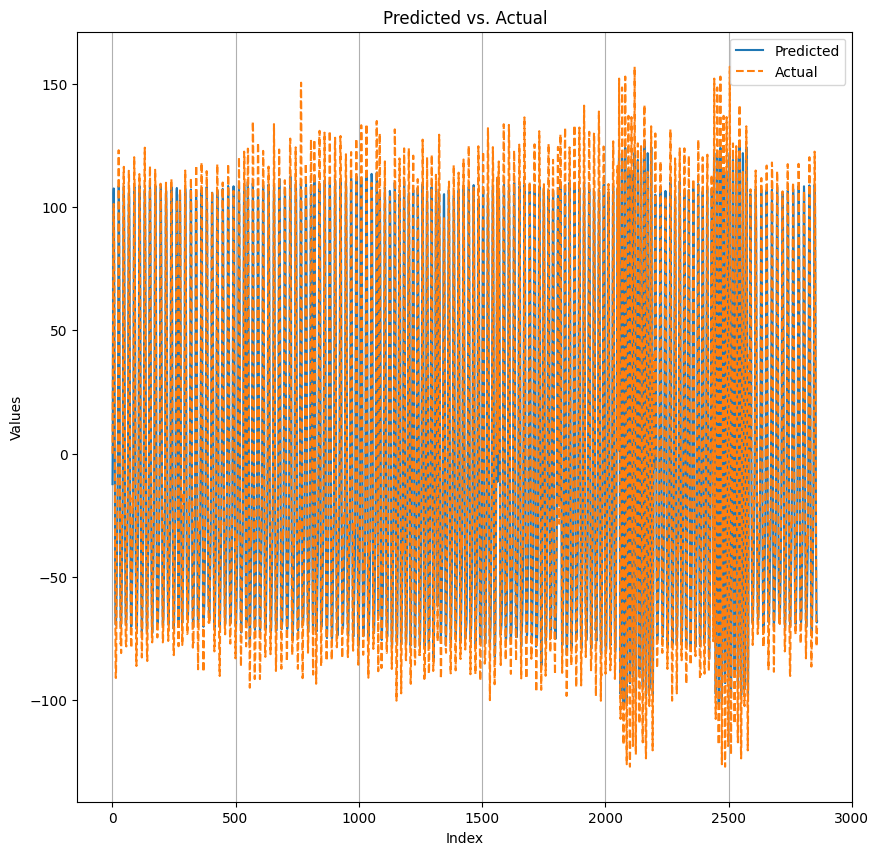

SCENE 1  TRAIN: [1483  289 2561 ... 2072 2278 1855]  TEST: [2859 2860 2861 ... 5532 5533 5534]
Epoch 1/30
179/179 [==============================] - 9s 19ms/step - loss: 0.1406 - val_loss: 0.1480
Epoch 2/30
179/179 [==============================] - 3s 14ms/step - loss: 0.0881 - val_loss: 0.1353
Epoch 3/30
179/179 [==============================] - 3s 14ms/step - loss: 0.0723 - val_loss: 0.0911
Epoch 4/30
179/179 [==============================] - 3s 19ms/step - loss: 0.0585 - val_loss: 0.0702
Epoch 5/30
179/179 [==============================] - 3s 15ms/step - loss: 0.0525 - val_loss: 0.0711
Epoch 6/30
179/179 [==============================] - 3s 18ms/step - loss: 0.0469 - val_loss: 0.0614
Epoch 7/30
179/179 [==============================] - 3s 14ms/step - loss: 0.0504 - val_loss: 0.0661
Epoch 8/30
179/179 [==============================] - 3s 14ms/step - loss: 0.0489 - val_loss: 0.0556
Epoch 9/30
179/179 [==============================] - 3s 19ms/step - loss: 0.0424 - val_loss: 0.0

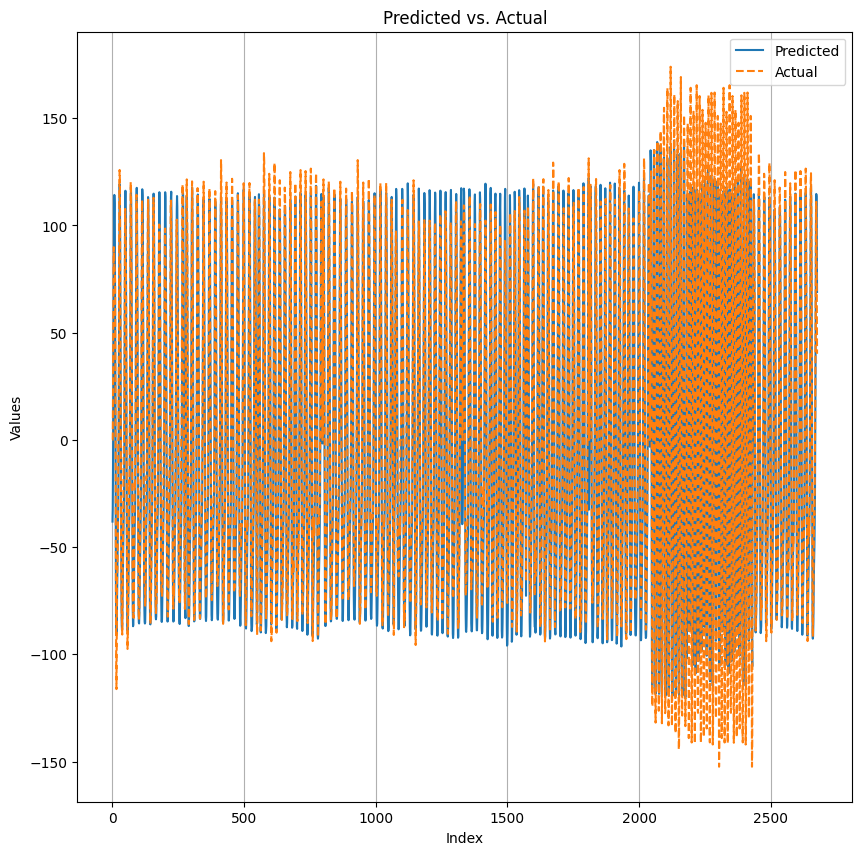

In [10]:
ResultadosRegressao(Resultados3Matrix[0],Resultados3Matrix[1],Resultados3Matrix[2])

# Exercicio 3 Cross Validation Utilizadores

SCENE 0  TRAIN: [5112 1369 4585 ... 2720 1705 1716]  TEST: [   0    1    2 ... 3926 3927 3928]
Epoch 1/30
212/212 [==============================] - 9s 18ms/step - loss: 0.1397 - val_loss: 0.0940
Epoch 2/30
212/212 [==============================] - 3s 12ms/step - loss: 0.0801 - val_loss: 0.0443
Epoch 3/30
212/212 [==============================] - 3s 14ms/step - loss: 0.0596 - val_loss: 0.0410
Epoch 4/30
212/212 [==============================] - 3s 15ms/step - loss: 0.0498 - val_loss: 0.0390
Epoch 5/30
212/212 [==============================] - 3s 13ms/step - loss: 0.0473 - val_loss: 0.0432
Epoch 6/30
212/212 [==============================] - 3s 12ms/step - loss: 0.0470 - val_loss: 0.0396
Epoch 7/30
212/212 [==============================] - 3s 12ms/step - loss: 0.0445 - val_loss: 0.0378
Epoch 8/30
212/212 [==============================] - 3s 16ms/step - loss: 0.0434 - val_loss: 0.0288
Epoch 9/30
212/212 [==============================] - 3s 13ms/step - loss: 0.0392 - val_loss: 0.0

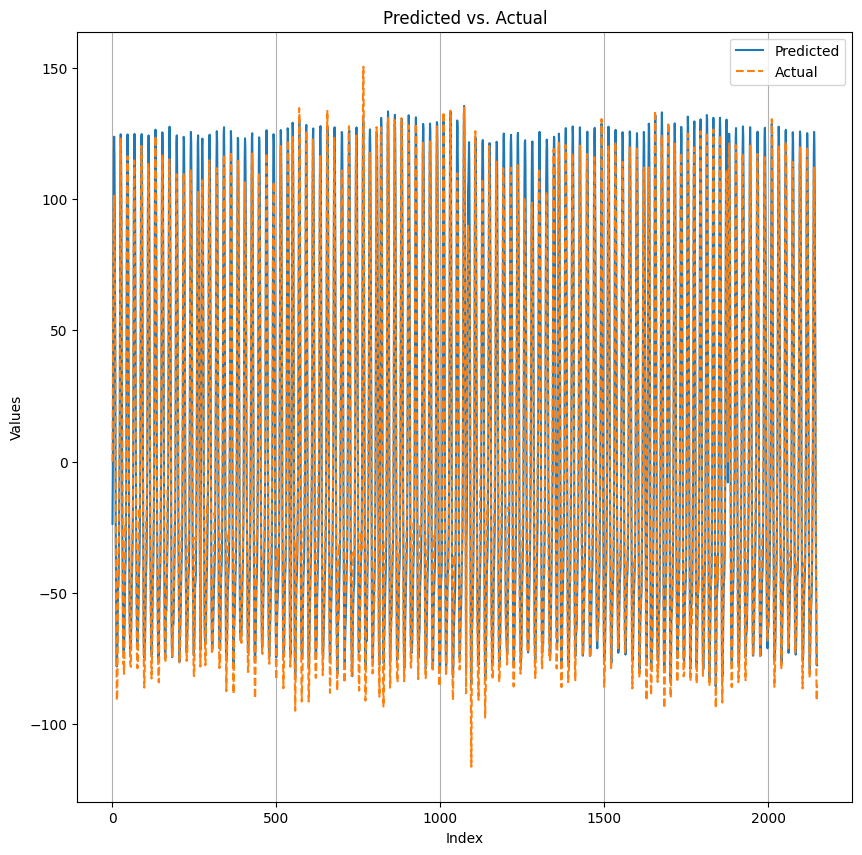

SCENE 1  TRAIN: [2110 2131 2538 ... 2609  675 3566]  TEST: [1079 1080 1081 ... 4896 4897 4898]
Epoch 1/30
225/225 [==============================] - 10s 18ms/step - loss: 0.1387 - val_loss: 0.1336
Epoch 2/30
225/225 [==============================] - 3s 12ms/step - loss: 0.0882 - val_loss: 0.0757
Epoch 3/30
225/225 [==============================] - 3s 12ms/step - loss: 0.0581 - val_loss: 0.0395
Epoch 4/30
225/225 [==============================] - 4s 17ms/step - loss: 0.0495 - val_loss: 0.0525
Epoch 5/30
225/225 [==============================] - 3s 13ms/step - loss: 0.0446 - val_loss: 0.0353
Epoch 6/30
225/225 [==============================] - 3s 13ms/step - loss: 0.0430 - val_loss: 0.0360
Epoch 7/30
225/225 [==============================] - 3s 13ms/step - loss: 0.0448 - val_loss: 0.0545
Epoch 8/30
225/225 [==============================] - 3s 14ms/step - loss: 0.0407 - val_loss: 0.0458
Epoch 9/30
225/225 [==============================] - 4s 17ms/step - loss: 0.0370 - val_loss: 0.

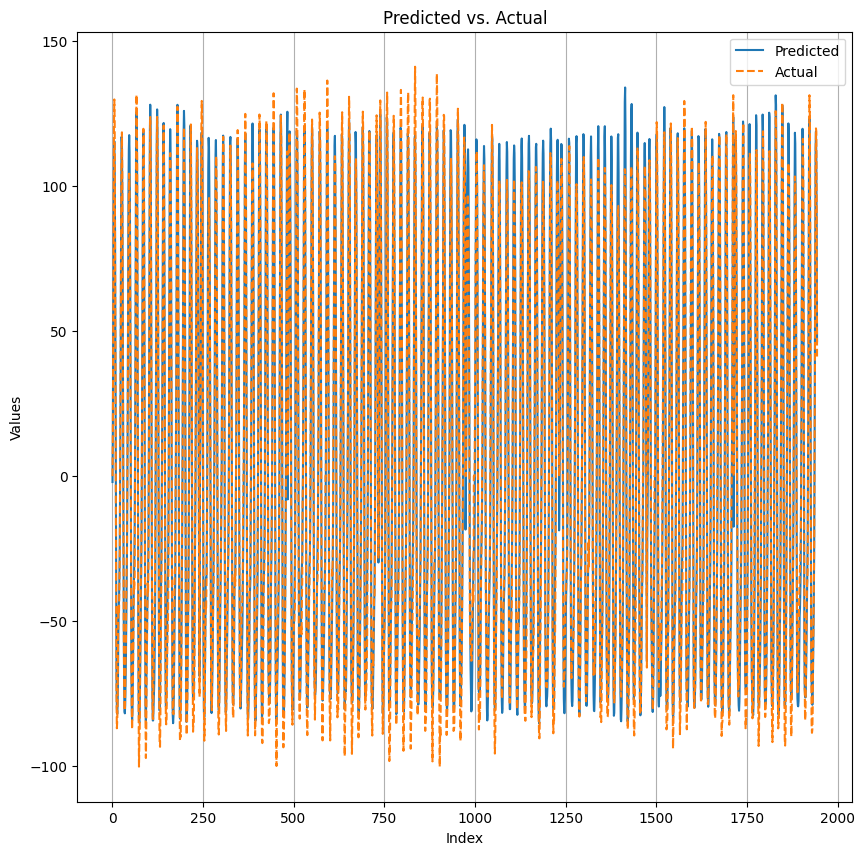

SCENE 2  TRAIN: [ 604  156 4578 ... 4160  981 4666]  TEST: [2052 2053 2054 ... 5532 5533 5534]
Epoch 1/30
256/256 [==============================] - 9s 16ms/step - loss: 0.1476 - val_loss: 0.2058
Epoch 2/30
256/256 [==============================] - 3s 13ms/step - loss: 0.0782 - val_loss: 0.1980
Epoch 3/30
256/256 [==============================] - 4s 17ms/step - loss: 0.0568 - val_loss: 0.1870
Epoch 4/30
256/256 [==============================] - 4s 17ms/step - loss: 0.0504 - val_loss: 0.1661
Epoch 5/30
256/256 [==============================] - 3s 13ms/step - loss: 0.0486 - val_loss: 0.1477
Epoch 6/30
256/256 [==============================] - 4s 14ms/step - loss: 0.0454 - val_loss: 0.1522
Epoch 7/30
256/256 [==============================] - 4s 16ms/step - loss: 0.0437 - val_loss: 0.1309
Epoch 8/30
256/256 [==============================] - 3s 12ms/step - loss: 0.0456 - val_loss: 0.1271
Epoch 9/30
256/256 [==============================] - 3s 13ms/step - loss: 0.0428 - val_loss: 0.1

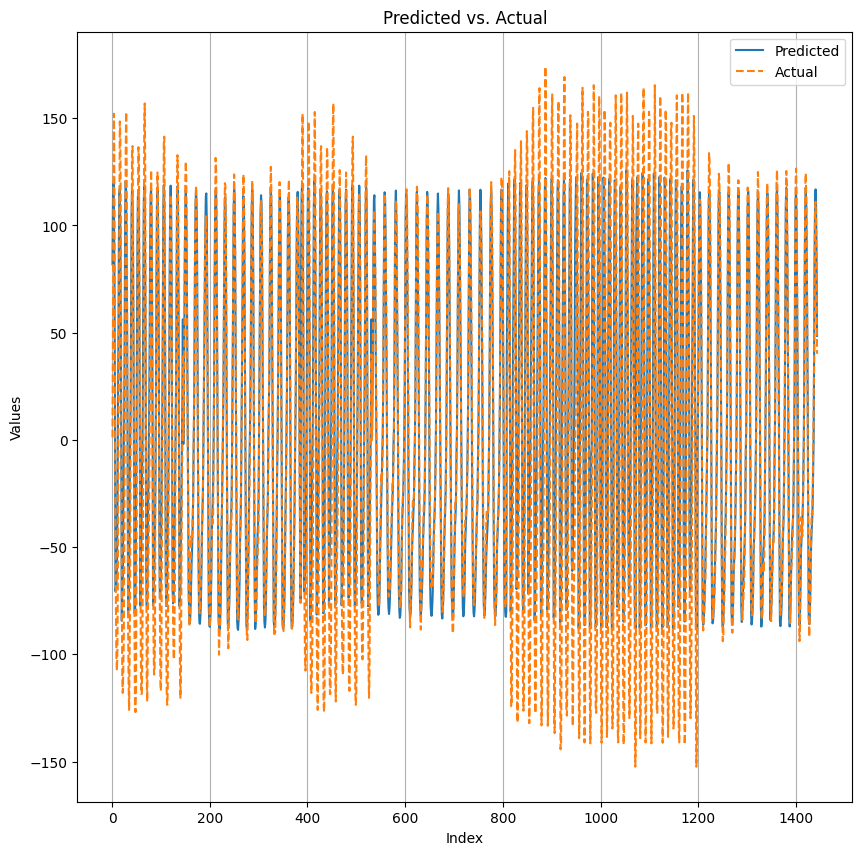

In [11]:
ResultadosRegressao(Resultados3Matrix[0],Resultados3Matrix[1],Resultados3Matrix[3])

# Exercicio 3 Cross Validation Repeticoes

SCENE 0  TRAIN: [2771 4556  338 ... 2447 1744 5384]  TEST: [   0    1    2 ... 5036 5037 5038]
Epoch 1/30
263/263 [==============================] - 10s 14ms/step - loss: 0.1396 - val_loss: 0.1321
Epoch 2/30
263/263 [==============================] - 3s 11ms/step - loss: 0.0767 - val_loss: 0.0616
Epoch 3/30
263/263 [==============================] - 3s 11ms/step - loss: 0.0574 - val_loss: 0.0863
Epoch 4/30
263/263 [==============================] - 4s 14ms/step - loss: 0.0498 - val_loss: 0.0592
Epoch 5/30
263/263 [==============================] - 3s 12ms/step - loss: 0.0451 - val_loss: 0.0431
Epoch 6/30
263/263 [==============================] - 3s 11ms/step - loss: 0.0409 - val_loss: 0.0497
Epoch 7/30
263/263 [==============================] - 3s 11ms/step - loss: 0.0417 - val_loss: 0.0422
Epoch 8/30
263/263 [==============================] - 3s 13ms/step - loss: 0.0393 - val_loss: 0.0423
Epoch 9/30
263/263 [==============================] - 4s 14ms/step - loss: 0.0374 - val_loss: 0.

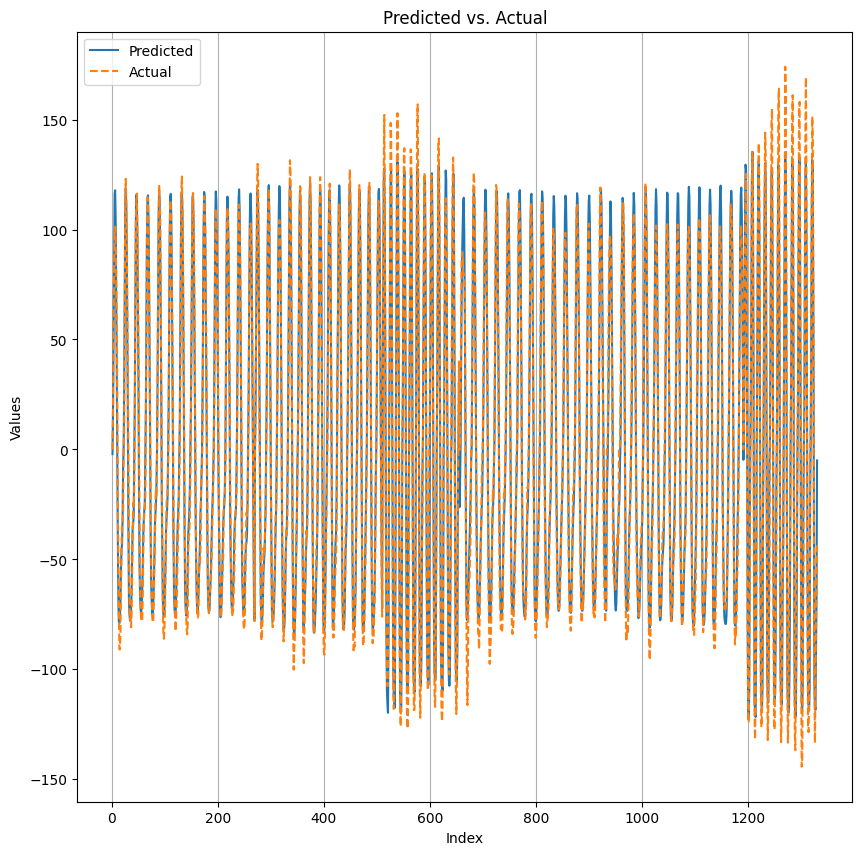

SCENE 1  TRAIN: [2183 1715 4448 ...  604  779 4666]  TEST: [ 269  270  271 ... 5161 5162 5163]
Epoch 1/30
259/259 [==============================] - 8s 15ms/step - loss: 0.1193 - val_loss: 0.0921
Epoch 2/30
259/259 [==============================] - 4s 16ms/step - loss: 0.0727 - val_loss: 0.0461
Epoch 3/30
259/259 [==============================] - 3s 12ms/step - loss: 0.0647 - val_loss: 0.0525
Epoch 4/30
259/259 [==============================] - 3s 12ms/step - loss: 0.0519 - val_loss: 0.0526
Epoch 5/30
259/259 [==============================] - 3s 12ms/step - loss: 0.0466 - val_loss: 0.0336
Epoch 6/30
259/259 [==============================] - 4s 14ms/step - loss: 0.0443 - val_loss: 0.0652
Epoch 7/30
259/259 [==============================] - 3s 13ms/step - loss: 0.0411 - val_loss: 0.0287
Epoch 8/30
259/259 [==============================] - 3s 12ms/step - loss: 0.0380 - val_loss: 0.0406
Epoch 9/30
259/259 [==============================] - 3s 13ms/step - loss: 0.0375 - val_loss: 0.0

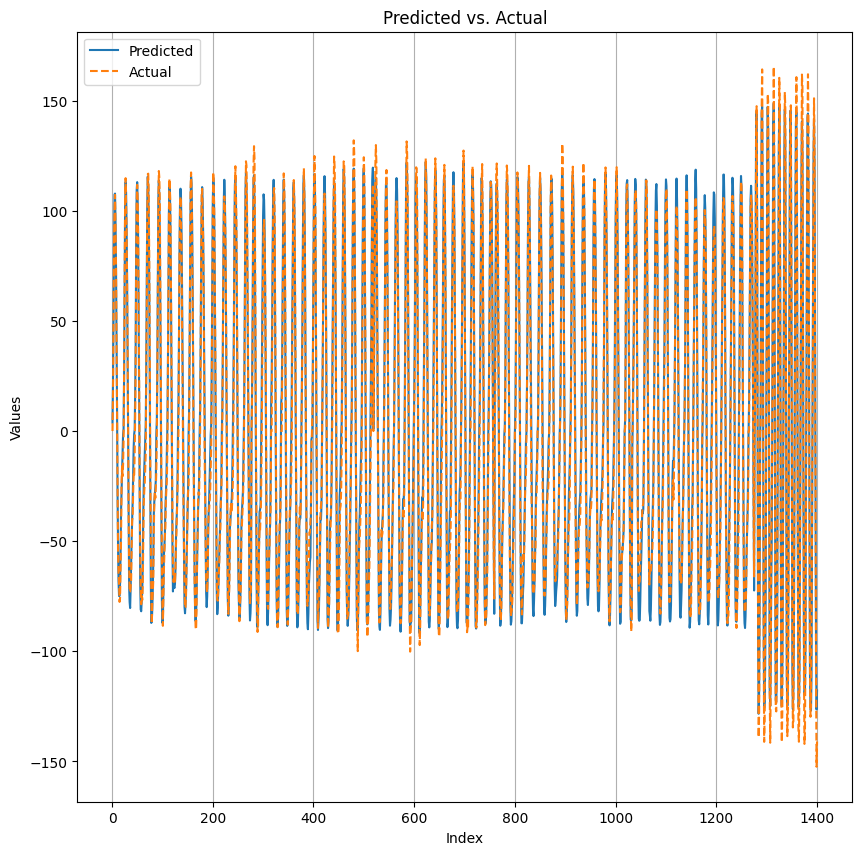

SCENE 2  TRAIN: [4224  176 4872 ... 4883 2411 5109]  TEST: [ 545  546  547 ... 5286 5287 5288]
Epoch 1/30
267/267 [==============================] - 9s 15ms/step - loss: 0.1245 - val_loss: 0.1263
Epoch 2/30
267/267 [==============================] - 3s 13ms/step - loss: 0.0729 - val_loss: 0.0923
Epoch 3/30
267/267 [==============================] - 4s 15ms/step - loss: 0.0632 - val_loss: 0.0637
Epoch 4/30
267/267 [==============================] - 4s 13ms/step - loss: 0.0486 - val_loss: 0.0569
Epoch 5/30
267/267 [==============================] - 3s 12ms/step - loss: 0.0450 - val_loss: 0.0728
Epoch 6/30
267/267 [==============================] - 3s 12ms/step - loss: 0.0428 - val_loss: 0.0509
Epoch 7/30
267/267 [==============================] - 4s 15ms/step - loss: 0.0411 - val_loss: 0.0398
Epoch 8/30
267/267 [==============================] - 4s 14ms/step - loss: 0.0398 - val_loss: 0.0502
Epoch 9/30
267/267 [==============================] - 3s 12ms/step - loss: 0.0399 - val_loss: 0.0

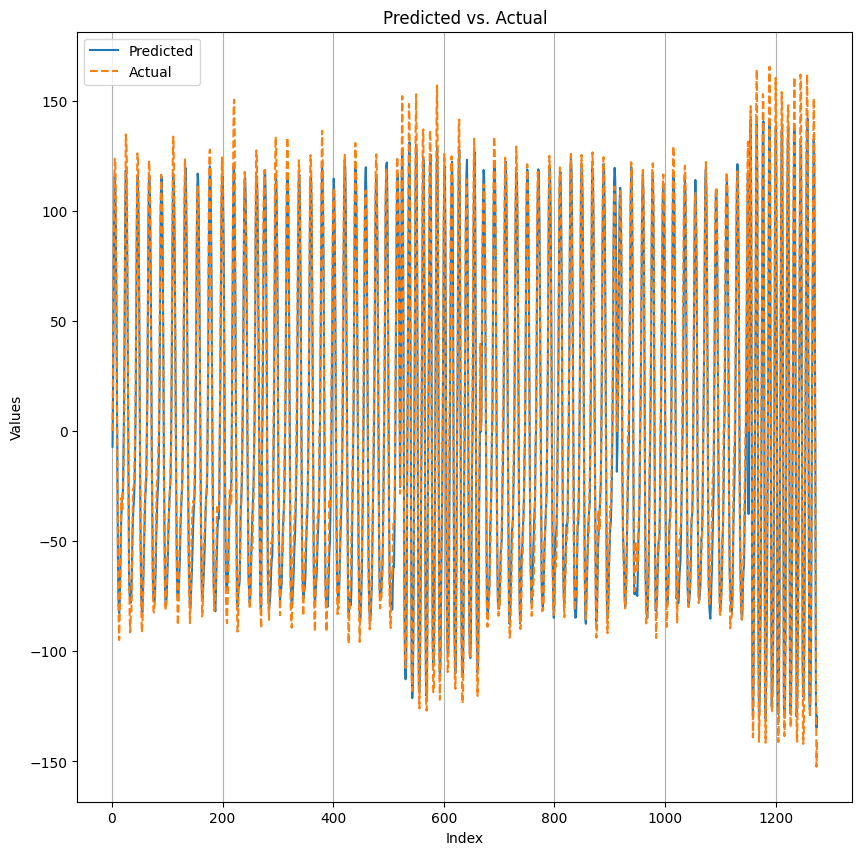

SCENE 3  TRAIN: [4009 2317  650 ... 5045 1084 3189]  TEST: [ 815  816  817 ... 5532 5533 5534]
Epoch 1/30
251/251 [==============================] - 10s 17ms/step - loss: 0.1234 - val_loss: 0.0977
Epoch 2/30
251/251 [==============================] - 3s 13ms/step - loss: 0.0665 - val_loss: 0.0736
Epoch 3/30
251/251 [==============================] - 4s 16ms/step - loss: 0.0553 - val_loss: 0.0755
Epoch 4/30
251/251 [==============================] - 5s 19ms/step - loss: 0.0552 - val_loss: 0.0471
Epoch 5/30
251/251 [==============================] - 4s 17ms/step - loss: 0.0492 - val_loss: 0.0350
Epoch 6/30
251/251 [==============================] - 3s 13ms/step - loss: 0.0463 - val_loss: 0.0298
Epoch 7/30
251/251 [==============================] - 3s 13ms/step - loss: 0.0420 - val_loss: 0.0274
Epoch 8/30
251/251 [==============================] - 4s 16ms/step - loss: 0.0389 - val_loss: 0.0384
Epoch 9/30
251/251 [==============================] - 4s 14ms/step - loss: 0.0403 - val_loss: 0.

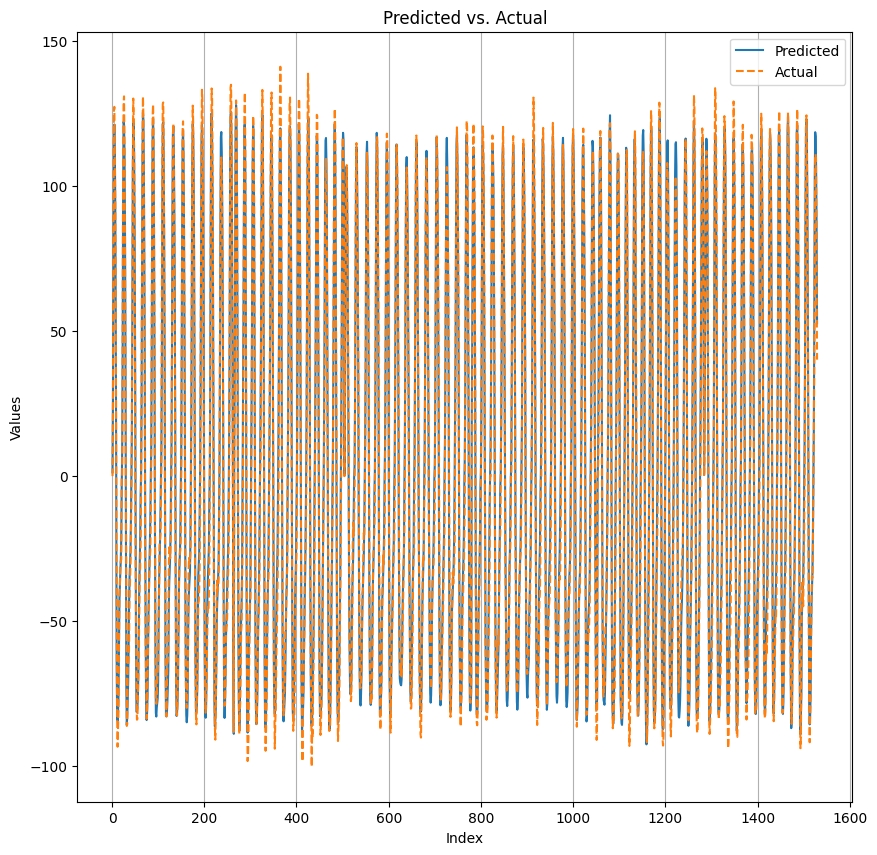

In [12]:
ResultadosRegressao(Resultados3Matrix[0],Resultados3Matrix[1],Resultados3Matrix[4])

# Exercicio 3 Cross Validation Scenes

SCENE 0  TRAIN: [2534 4404 1920 ...  879  550 3021]  TEST: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 

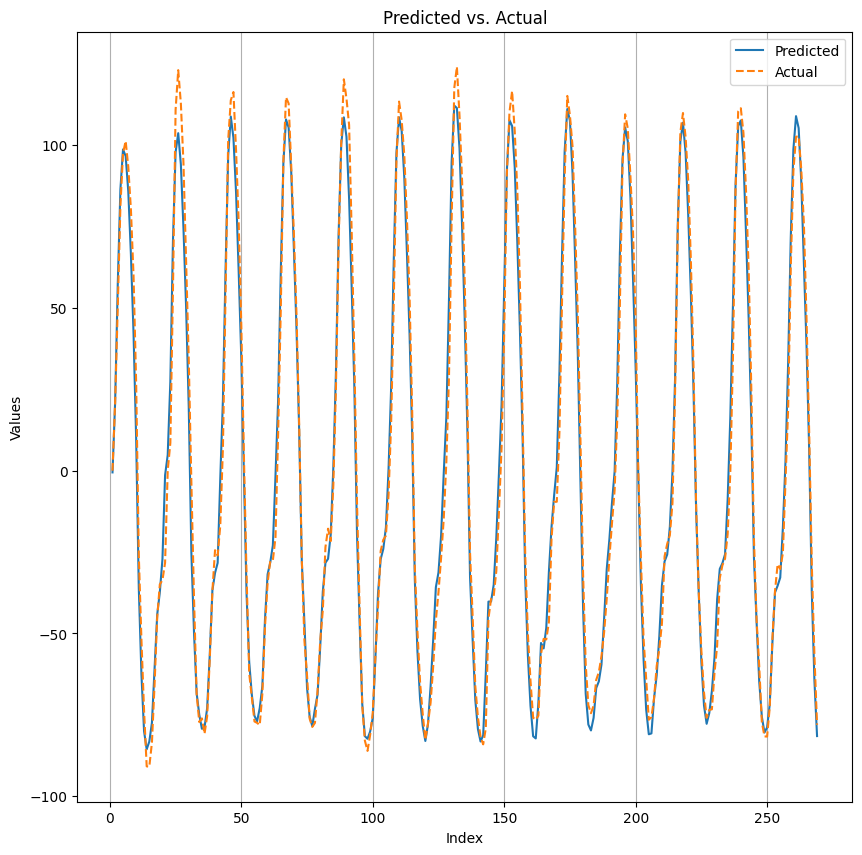

SCENE 1  TRAIN: [5064 4160 3045 ... 2883 3778 5036]  TEST: [269 270 271 272 273 274 275 276 277 278 279 280 281 282 283 284 285 286
 287 288 289 290 291 292 293 294 295 296 297 298 299 300 301 302 303 304
 305 306 307 308 309 310 311 312 313 314 315 316 317 318 319 320 321 322
 323 324 325 326 327 328 329 330 331 332 333 334 335 336 337 338 339 340
 341 342 343 344 345 346 347 348 349 350 351 352 353 354 355 356 357 358
 359 360 361 362 363 364 365 366 367 368 369 370 371 372 373 374 375 376
 377 378 379 380 381 382 383 384 385 386 387 388 389 390 391 392 393 394
 395 396 397 398 399 400 401 402 403 404 405 406 407 408 409 410 411 412
 413 414 415 416 417 418 419 420 421 422 423 424 425 426 427 428 429 430
 431 432 433 434 435 436 437 438 439 440 441 442 443 444 445 446 447 448
 449 450 451 452 453 454 455 456 457 458 459 460 461 462 463 464 465 466
 467 468 469 470 471 472 473 474 475 476 477 478 479 480 481 482 483 484
 485 486 487 488 489 490 491 492 493 494 495 496 497 498 499 500 

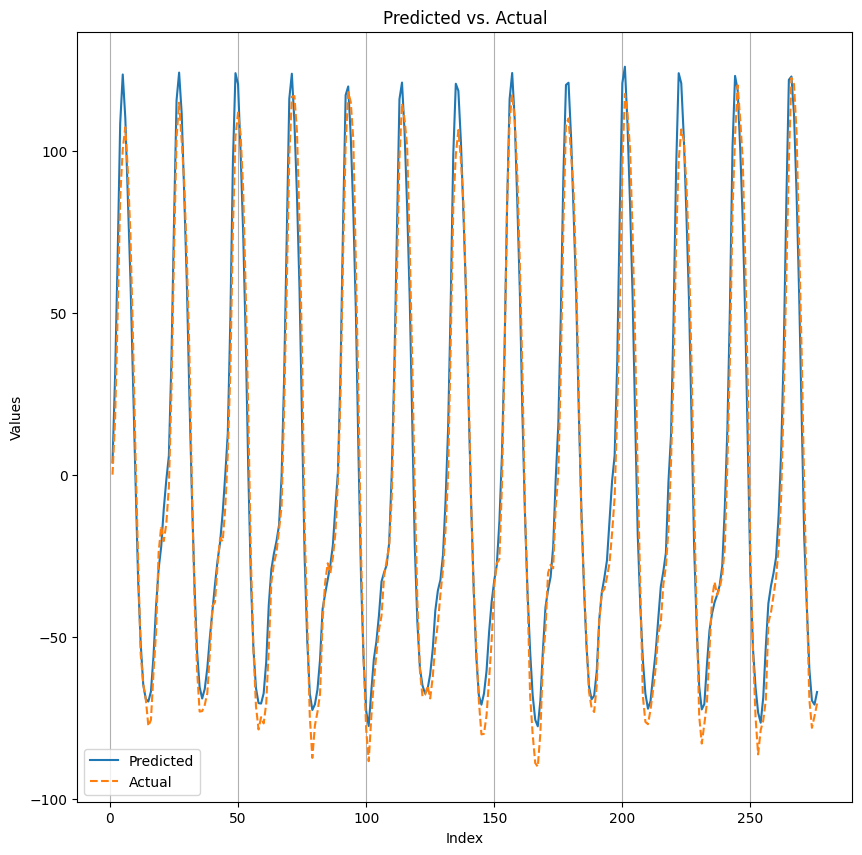

SCENE 2  TRAIN: [2998 2181 3726 ...   66 4854 4267]  TEST: [545 546 547 548 549 550 551 552 553 554 555 556 557 558 559 560 561 562
 563 564 565 566 567 568 569 570 571 572 573 574 575 576 577 578 579 580
 581 582 583 584 585 586 587 588 589 590 591 592 593 594 595 596 597 598
 599 600 601 602 603 604 605 606 607 608 609 610 611 612 613 614 615 616
 617 618 619 620 621 622 623 624 625 626 627 628 629 630 631 632 633 634
 635 636 637 638 639 640 641 642 643 644 645 646 647 648 649 650 651 652
 653 654 655 656 657 658 659 660 661 662 663 664 665 666 667 668 669 670
 671 672 673 674 675 676 677 678 679 680 681 682 683 684 685 686 687 688
 689 690 691 692 693 694 695 696 697 698 699 700 701 702 703 704 705 706
 707 708 709 710 711 712 713 714 715 716 717 718 719 720 721 722 723 724
 725 726 727 728 729 730 731 732 733 734 735 736 737 738 739 740 741 742
 743 744 745 746 747 748 749 750 751 752 753 754 755 756 757 758 759 760
 761 762 763 764 765 766 767 768 769 770 771 772 773 774 775 776 

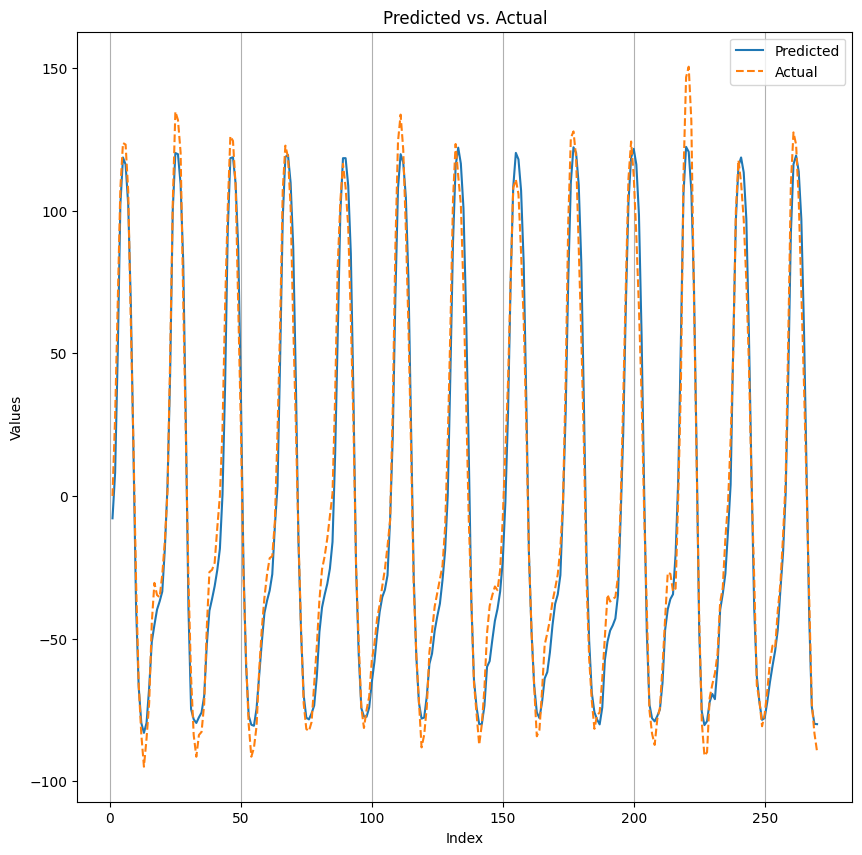

SCENE 3  TRAIN: [3340 3342 1663 ... 4864 5018 3758]  TEST: [ 815  816  817  818  819  820  821  822  823  824  825  826  827  828
  829  830  831  832  833  834  835  836  837  838  839  840  841  842
  843  844  845  846  847  848  849  850  851  852  853  854  855  856
  857  858  859  860  861  862  863  864  865  866  867  868  869  870
  871  872  873  874  875  876  877  878  879  880  881  882  883  884
  885  886  887  888  889  890  891  892  893  894  895  896  897  898
  899  900  901  902  903  904  905  906  907  908  909  910  911  912
  913  914  915  916  917  918  919  920  921  922  923  924  925  926
  927  928  929  930  931  932  933  934  935  936  937  938  939  940
  941  942  943  944  945  946  947  948  949  950  951  952  953  954
  955  956  957  958  959  960  961  962  963  964  965  966  967  968
  969  970  971  972  973  974  975  976  977  978  979  980  981  982
  983  984  985  986  987  988  989  990  991  992  993  994  995  996
  997  998  999 10

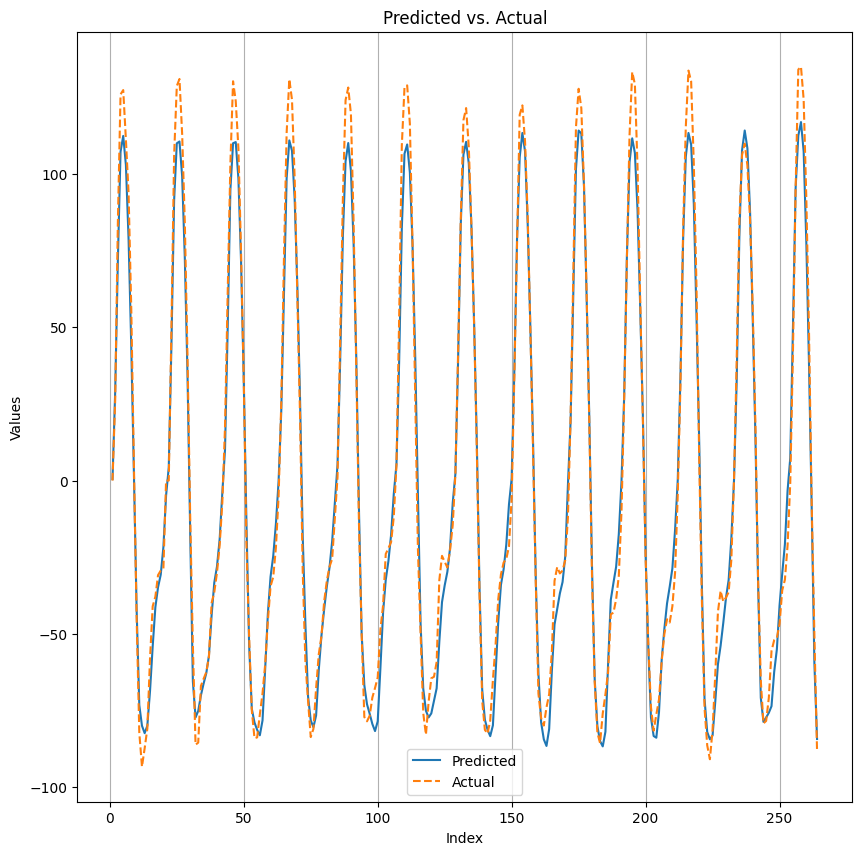

SCENE 4  TRAIN: [1815 2582 3703 ... 4131 4540 5261]  TEST: [1079 1080 1081 1082 1083 1084 1085 1086 1087 1088 1089 1090 1091 1092
 1093 1094 1095 1096 1097 1098 1099 1100 1101 1102 1103 1104 1105 1106
 1107 1108 1109 1110 1111 1112 1113 1114 1115 1116 1117 1118 1119 1120
 1121 1122 1123 1124 1125 1126 1127 1128 1129 1130 1131 1132 1133 1134
 1135 1136 1137 1138 1139 1140 1141 1142 1143 1144 1145 1146 1147 1148
 1149 1150 1151 1152 1153 1154 1155 1156 1157 1158 1159 1160 1161 1162
 1163 1164 1165 1166 1167 1168 1169 1170 1171 1172 1173 1174 1175 1176
 1177 1178 1179 1180 1181 1182 1183 1184 1185 1186 1187 1188 1189 1190
 1191 1192 1193 1194 1195 1196 1197 1198 1199 1200 1201 1202 1203 1204
 1205 1206 1207 1208 1209 1210 1211 1212 1213 1214 1215 1216 1217 1218
 1219 1220 1221 1222 1223 1224 1225 1226 1227 1228 1229 1230 1231 1232
 1233 1234 1235 1236 1237 1238 1239 1240 1241 1242 1243 1244 1245 1246
 1247 1248 1249 1250 1251 1252 1253 1254 1255 1256 1257 1258 1259 1260
 1261 1262 1263 12

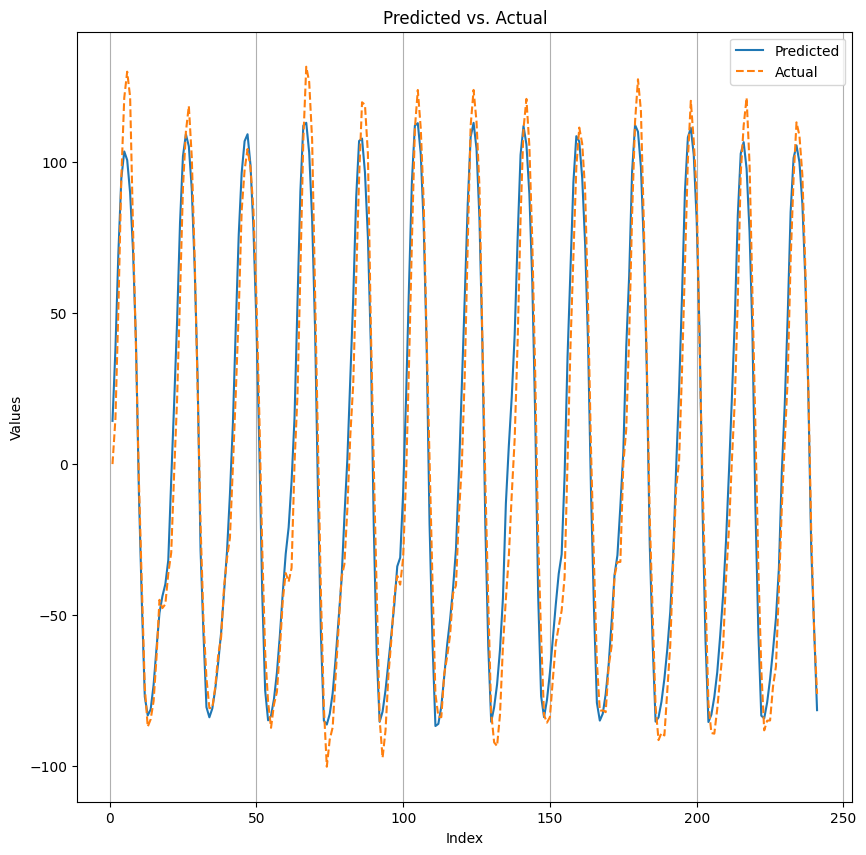

SCENE 5  TRAIN: [ 731 1198 5137 ... 3847  869 1865]  TEST: [1320 1321 1322 1323 1324 1325 1326 1327 1328 1329 1330 1331 1332 1333
 1334 1335 1336 1337 1338 1339 1340 1341 1342 1343 1344 1345 1346 1347
 1348 1349 1350 1351 1352 1353 1354 1355 1356 1357 1358 1359 1360 1361
 1362 1363 1364 1365 1366 1367 1368 1369 1370 1371 1372 1373 1374 1375
 1376 1377 1378 1379 1380 1381 1382 1383 1384 1385 1386 1387 1388 1389
 1390 1391 1392 1393 1394 1395 1396 1397 1398 1399 1400 1401 1402 1403
 1404 1405 1406 1407 1408 1409 1410 1411 1412 1413 1414 1415 1416 1417
 1418 1419 1420 1421 1422 1423 1424 1425 1426 1427 1428 1429 1430 1431
 1432 1433 1434 1435 1436 1437 1438 1439 1440 1441 1442 1443 1444 1445
 1446 1447 1448 1449 1450 1451 1452 1453 1454 1455 1456 1457 1458 1459
 1460 1461 1462 1463 1464 1465 1466 1467 1468 1469 1470 1471 1472 1473
 1474 1475 1476 1477 1478 1479 1480 1481 1482 1483 1484 1485 1486 1487
 1488 1489 1490 1491 1492 1493 1494 1495 1496 1497 1498 1499 1500 1501
 1502 1503 1504 15

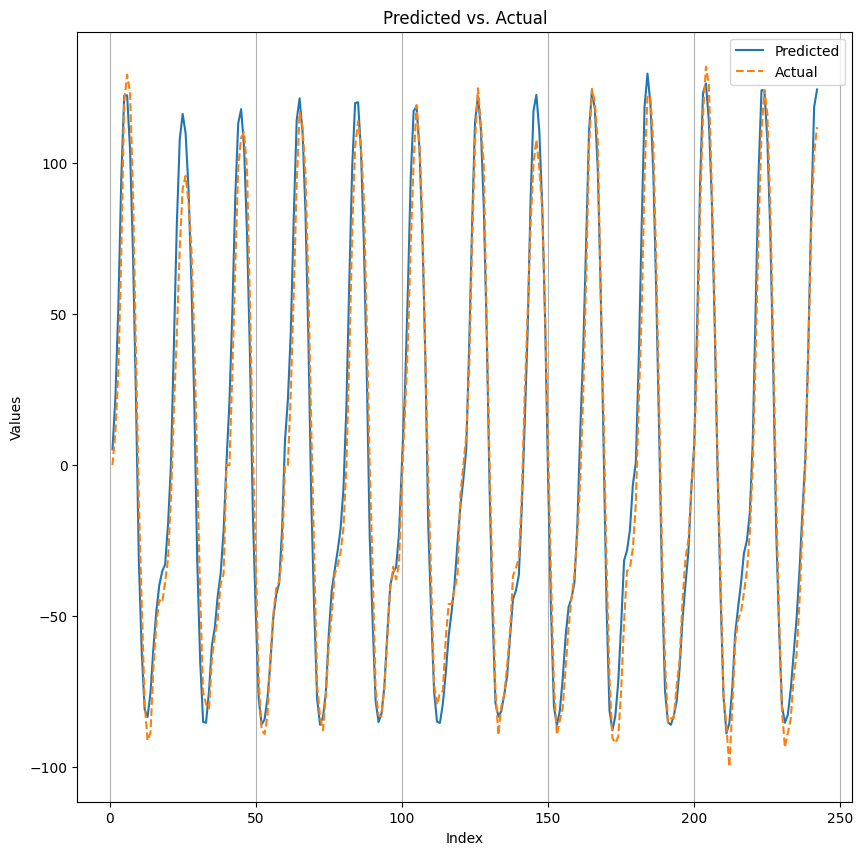

SCENE 6  TRAIN: [ 415  447 1175 ... 4117 3941 4611]  TEST: [1562 1563 1564 1565 1566 1567 1568 1569 1570 1571 1572 1573 1574 1575
 1576 1577 1578 1579 1580 1581 1582 1583 1584 1585 1586 1587 1588 1589
 1590 1591 1592 1593 1594 1595 1596 1597 1598 1599 1600 1601 1602 1603
 1604 1605 1606 1607 1608 1609 1610 1611 1612 1613 1614 1615 1616 1617
 1618 1619 1620 1621 1622 1623 1624 1625 1626 1627 1628 1629 1630 1631
 1632 1633 1634 1635 1636 1637 1638 1639 1640 1641 1642 1643 1644 1645
 1646 1647 1648 1649 1650 1651 1652 1653 1654 1655 1656 1657 1658 1659
 1660 1661 1662 1663 1664 1665 1666 1667 1668 1669 1670 1671 1672 1673
 1674 1675 1676 1677 1678 1679 1680 1681 1682 1683 1684 1685 1686 1687
 1688 1689 1690 1691 1692 1693 1694 1695 1696 1697 1698 1699 1700 1701
 1702 1703 1704 1705 1706 1707 1708 1709 1710 1711 1712 1713 1714 1715
 1716 1717 1718 1719 1720 1721 1722 1723 1724 1725 1726 1727 1728 1729
 1730 1731 1732 1733 1734 1735 1736 1737 1738 1739 1740 1741 1742 1743
 1744 1745 1746 17

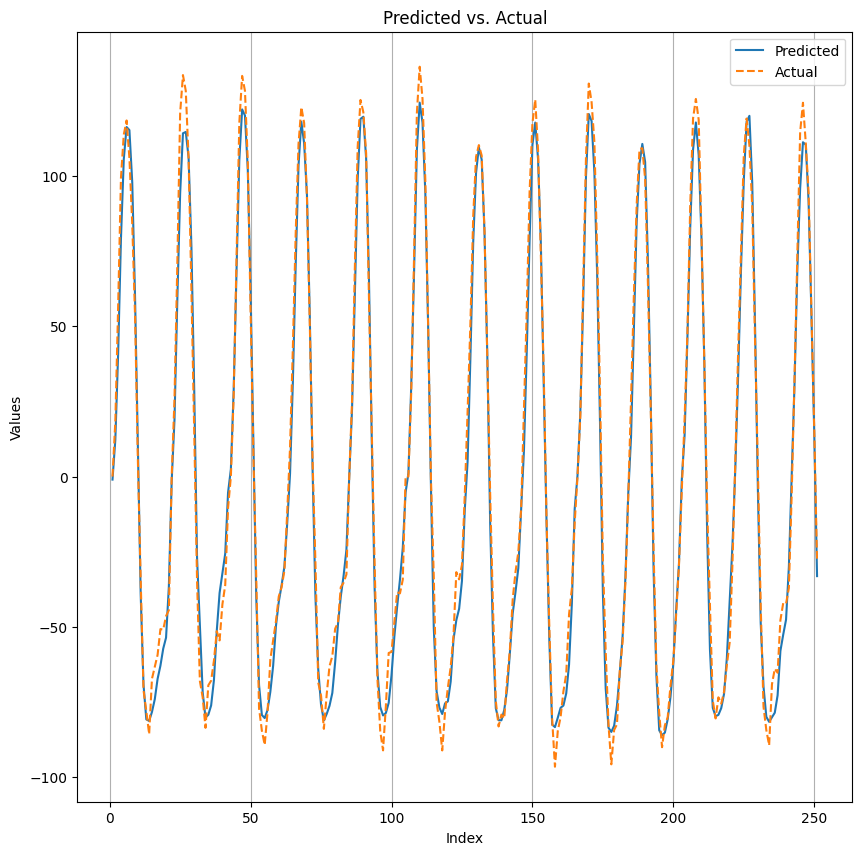

SCENE 7  TRAIN: [3822 2811 4127 ... 3896 4409  689]  TEST: [1813 1814 1815 1816 1817 1818 1819 1820 1821 1822 1823 1824 1825 1826
 1827 1828 1829 1830 1831 1832 1833 1834 1835 1836 1837 1838 1839 1840
 1841 1842 1843 1844 1845 1846 1847 1848 1849 1850 1851 1852 1853 1854
 1855 1856 1857 1858 1859 1860 1861 1862 1863 1864 1865 1866 1867 1868
 1869 1870 1871 1872 1873 1874 1875 1876 1877 1878 1879 1880 1881 1882
 1883 1884 1885 1886 1887 1888 1889 1890 1891 1892 1893 1894 1895 1896
 1897 1898 1899 1900 1901 1902 1903 1904 1905 1906 1907 1908 1909 1910
 1911 1912 1913 1914 1915 1916 1917 1918 1919 1920 1921 1922 1923 1924
 1925 1926 1927 1928 1929 1930 1931 1932 1933 1934 1935 1936 1937 1938
 1939 1940 1941 1942 1943 1944 1945 1946 1947 1948 1949 1950 1951 1952
 1953 1954 1955 1956 1957 1958 1959 1960 1961 1962 1963 1964 1965 1966
 1967 1968 1969 1970 1971 1972 1973 1974 1975 1976 1977 1978 1979 1980
 1981 1982 1983 1984 1985 1986 1987 1988 1989 1990 1991 1992 1993 1994
 1995 1996 1997 19

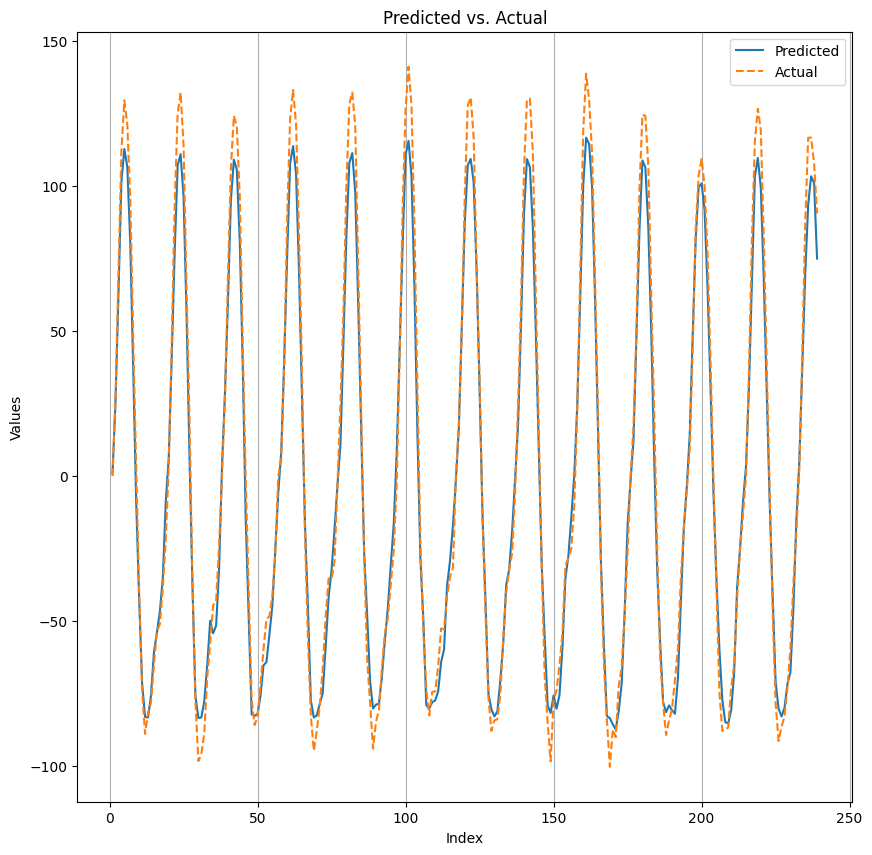

SCENE 8  TRAIN: [2442 4417 1751 ... 4773 5241 2299]  TEST: [2052 2053 2054 2055 2056 2057 2058 2059 2060 2061 2062 2063 2064 2065
 2066 2067 2068 2069 2070 2071 2072 2073 2074 2075 2076 2077 2078 2079
 2080 2081 2082 2083 2084 2085 2086 2087 2088 2089 2090 2091 2092 2093
 2094 2095 2096 2097 2098 2099 2100 2101 2102 2103 2104 2105 2106 2107
 2108 2109 2110 2111 2112 2113 2114 2115 2116 2117 2118 2119 2120 2121
 2122 2123 2124 2125 2126 2127 2128 2129 2130 2131 2132 2133 2134 2135
 2136 2137 2138 2139 2140 2141 2142 2143 2144 2145 2146 2147 2148 2149
 2150 2151 2152 2153 2154 2155 2156 2157 2158 2159 2160 2161 2162 2163
 2164 2165 2166 2167 2168 2169 2170 2171 2172 2173 2174 2175 2176 2177
 2178 2179 2180 2181 2182 2183 2184 2185 2186 2187 2188 2189 2190 2191
 2192 2193 2194 2195 2196]
Epoch 1/30
337/337 [==============================] - 10s 18ms/step - loss: 0.1192 - val_loss: 0.2388
Epoch 2/30
337/337 [==============================] - 4s 11ms/step - loss: 0.0671 - val_loss: 0.1283
E

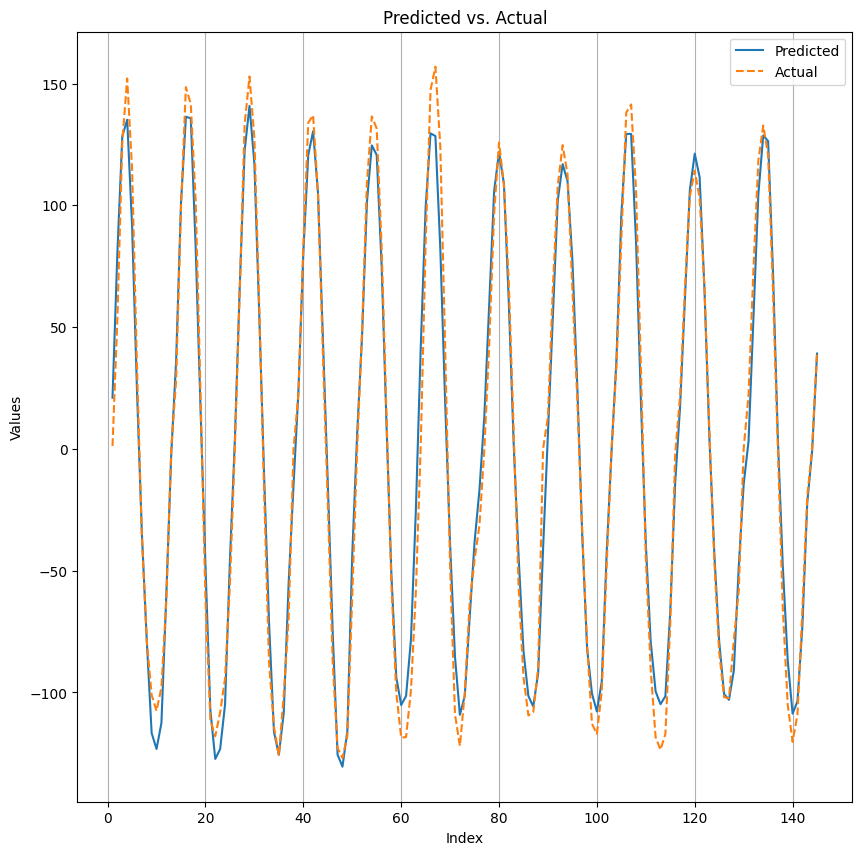

SCENE 9  TRAIN: [2717 3210  571 ... 3808 4463 1074]  TEST: [2197 2198 2199 2200 2201 2202 2203 2204 2205 2206 2207 2208 2209 2210
 2211 2212 2213 2214 2215 2216 2217 2218 2219 2220 2221 2222 2223 2224
 2225 2226 2227 2228 2229 2230 2231 2232 2233 2234 2235 2236 2237 2238
 2239 2240 2241 2242 2243 2244 2245 2246 2247 2248 2249 2250 2251 2252
 2253 2254 2255 2256 2257 2258 2259 2260 2261 2262 2263 2264 2265 2266
 2267 2268 2269 2270 2271 2272 2273 2274 2275 2276 2277 2278 2279 2280
 2281 2282 2283 2284 2285 2286 2287 2288 2289 2290 2291 2292 2293 2294
 2295 2296 2297 2298 2299 2300 2301 2302 2303 2304 2305 2306 2307 2308
 2309 2310 2311 2312 2313 2314 2315 2316 2317 2318 2319 2320 2321 2322
 2323 2324 2325 2326 2327 2328 2329 2330 2331 2332 2333 2334 2335 2336
 2337 2338 2339 2340 2341 2342 2343 2344 2345 2346 2347 2348 2349 2350
 2351 2352 2353 2354 2355 2356 2357 2358 2359 2360 2361 2362 2363 2364
 2365 2366 2367 2368 2369 2370 2371 2372 2373 2374 2375 2376 2377 2378
 2379 2380 2381 23

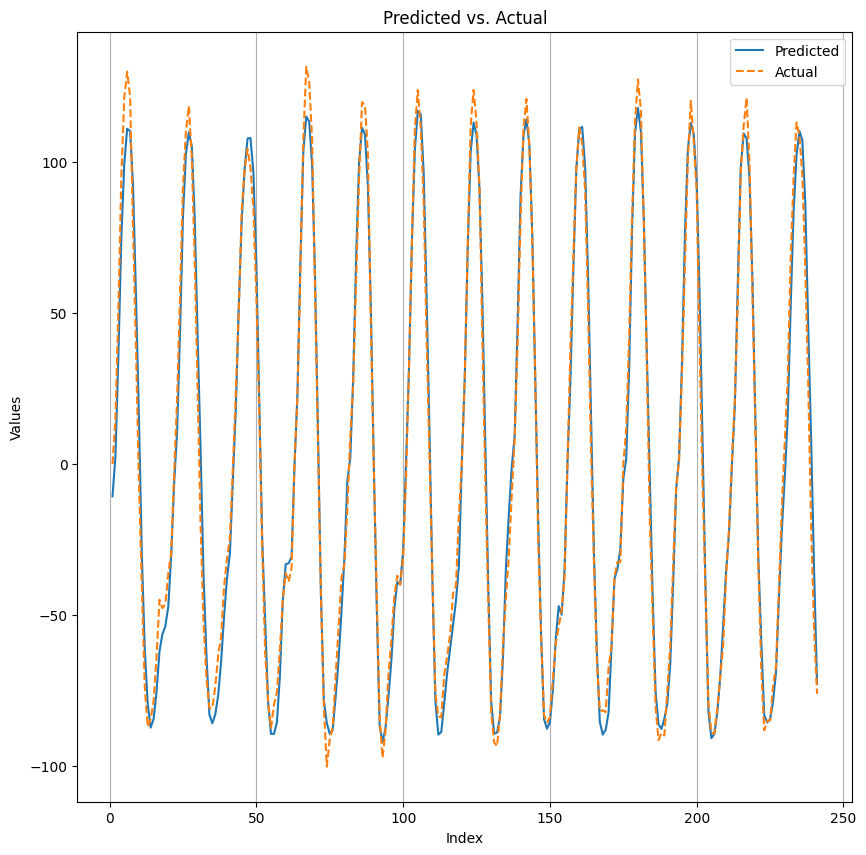

SCENE 10  TRAIN: [3655  918  592 ... 5222 3349  477]  TEST: [2438 2439 2440 2441 2442 2443 2444 2445 2446 2447 2448 2449 2450 2451
 2452 2453 2454 2455 2456 2457 2458 2459 2460 2461 2462 2463 2464 2465
 2466 2467 2468 2469 2470 2471 2472 2473 2474 2475 2476 2477 2478 2479
 2480 2481 2482 2483 2484 2485 2486 2487 2488 2489 2490 2491 2492 2493
 2494 2495 2496 2497 2498 2499 2500 2501 2502 2503 2504 2505 2506 2507
 2508 2509 2510 2511 2512 2513 2514 2515 2516 2517 2518 2519 2520 2521
 2522 2523 2524 2525 2526 2527 2528 2529 2530 2531 2532 2533 2534 2535
 2536 2537 2538 2539 2540 2541 2542 2543 2544 2545 2546 2547 2548 2549
 2550 2551 2552 2553 2554 2555 2556 2557 2558 2559 2560 2561 2562 2563
 2564 2565 2566 2567 2568 2569 2570 2571 2572 2573 2574 2575 2576 2577
 2578 2579 2580 2581 2582]
Epoch 1/30
337/337 [==============================] - 10s 14ms/step - loss: 0.1184 - val_loss: 0.2333
Epoch 2/30
337/337 [==============================] - 4s 11ms/step - loss: 0.0638 - val_loss: 0.0922


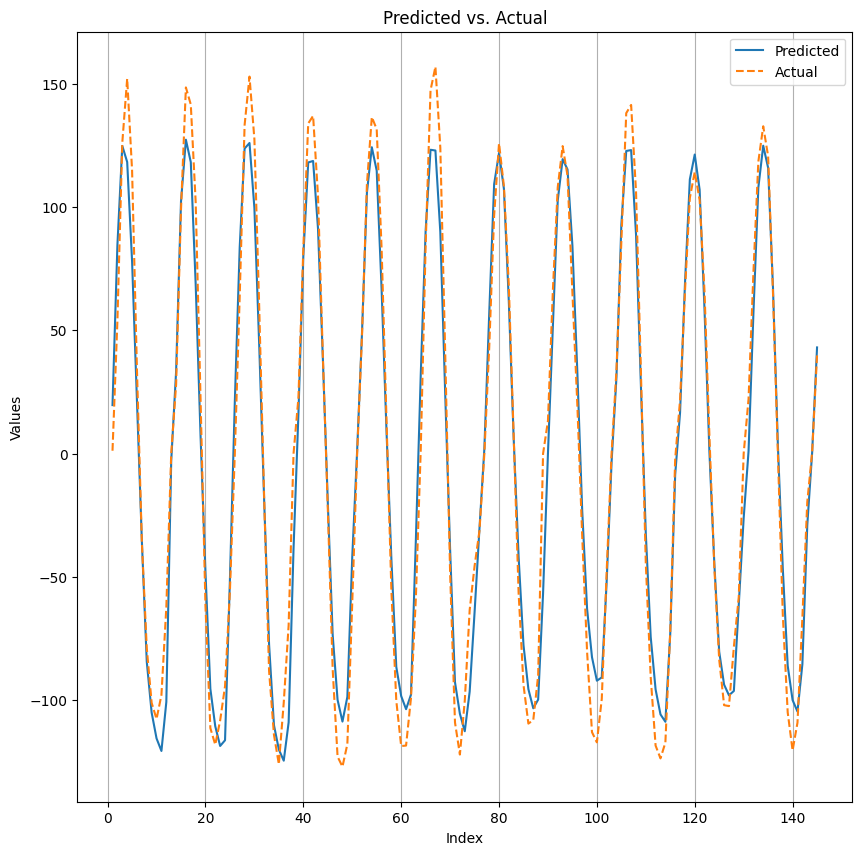

SCENE 11  TRAIN: [   4 1950 3416 ... 4247  341  675]  TEST: [2583 2584 2585 2586 2587 2588 2589 2590 2591 2592 2593 2594 2595 2596
 2597 2598 2599 2600 2601 2602 2603 2604 2605 2606 2607 2608 2609 2610
 2611 2612 2613 2614 2615 2616 2617 2618 2619 2620 2621 2622 2623 2624
 2625 2626 2627 2628 2629 2630 2631 2632 2633 2634 2635 2636 2637 2638
 2639 2640 2641 2642 2643 2644 2645 2646 2647 2648 2649 2650 2651 2652
 2653 2654 2655 2656 2657 2658 2659 2660 2661 2662 2663 2664 2665 2666
 2667 2668 2669 2670 2671 2672 2673 2674 2675 2676 2677 2678 2679 2680
 2681 2682 2683 2684 2685 2686 2687 2688 2689 2690 2691 2692 2693 2694
 2695 2696 2697 2698 2699 2700 2701 2702 2703 2704 2705 2706 2707 2708
 2709 2710 2711 2712 2713 2714 2715 2716 2717 2718 2719 2720 2721 2722
 2723 2724 2725 2726 2727 2728 2729 2730 2731 2732 2733 2734 2735 2736
 2737 2738 2739 2740 2741 2742 2743 2744 2745 2746 2747 2748 2749 2750
 2751 2752 2753 2754 2755 2756 2757 2758 2759 2760 2761 2762 2763 2764
 2765 2766 2767 2

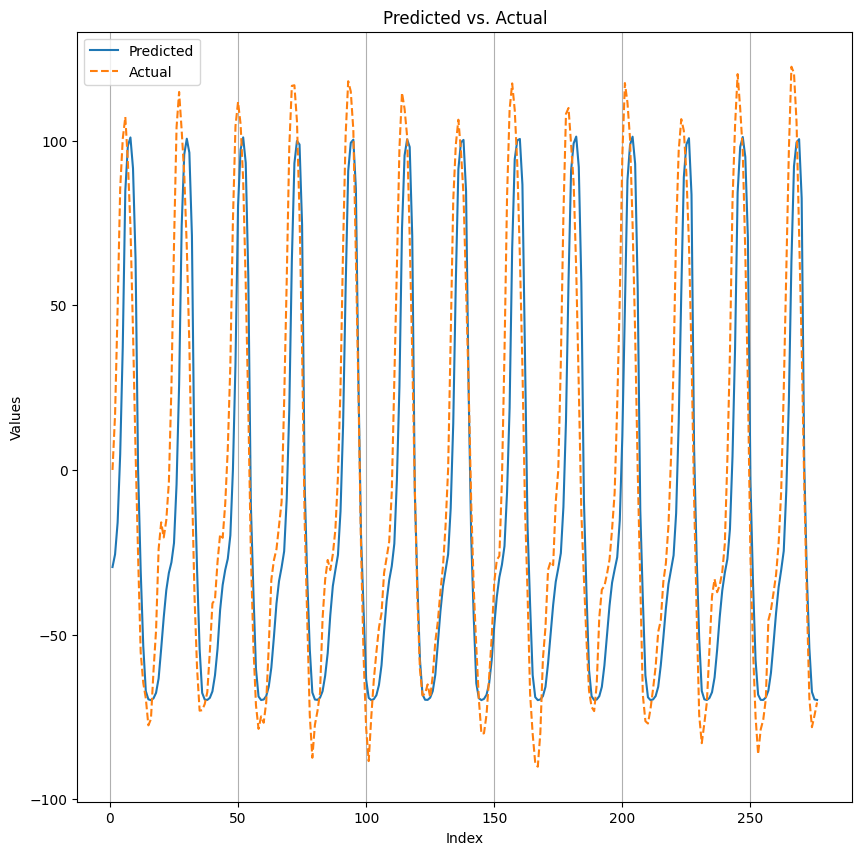

SCENE 12  TRAIN: [5426 1082 2417 ... 3386 3302 2761]  TEST: [2859 2860 2861 2862 2863 2864 2865 2866 2867 2868 2869 2870 2871 2872
 2873 2874 2875 2876 2877 2878 2879 2880 2881 2882 2883 2884 2885 2886
 2887 2888 2889 2890 2891 2892 2893 2894 2895 2896 2897 2898 2899 2900
 2901 2902 2903 2904 2905 2906 2907 2908 2909 2910 2911 2912 2913 2914
 2915 2916 2917 2918 2919 2920 2921 2922 2923 2924 2925 2926 2927 2928
 2929 2930 2931 2932 2933 2934 2935 2936 2937 2938 2939 2940 2941 2942
 2943 2944 2945 2946 2947 2948 2949 2950 2951 2952 2953 2954 2955 2956
 2957 2958 2959 2960 2961 2962 2963 2964 2965 2966 2967 2968 2969 2970
 2971 2972 2973 2974 2975 2976 2977 2978 2979 2980 2981 2982 2983 2984
 2985 2986 2987 2988 2989 2990 2991 2992 2993 2994 2995 2996 2997 2998
 2999 3000 3001 3002 3003 3004 3005 3006 3007 3008 3009 3010 3011 3012
 3013 3014 3015 3016 3017 3018 3019 3020 3021 3022 3023 3024 3025 3026
 3027 3028 3029 3030 3031 3032 3033 3034 3035 3036 3037 3038 3039 3040
 3041 3042 3043 3

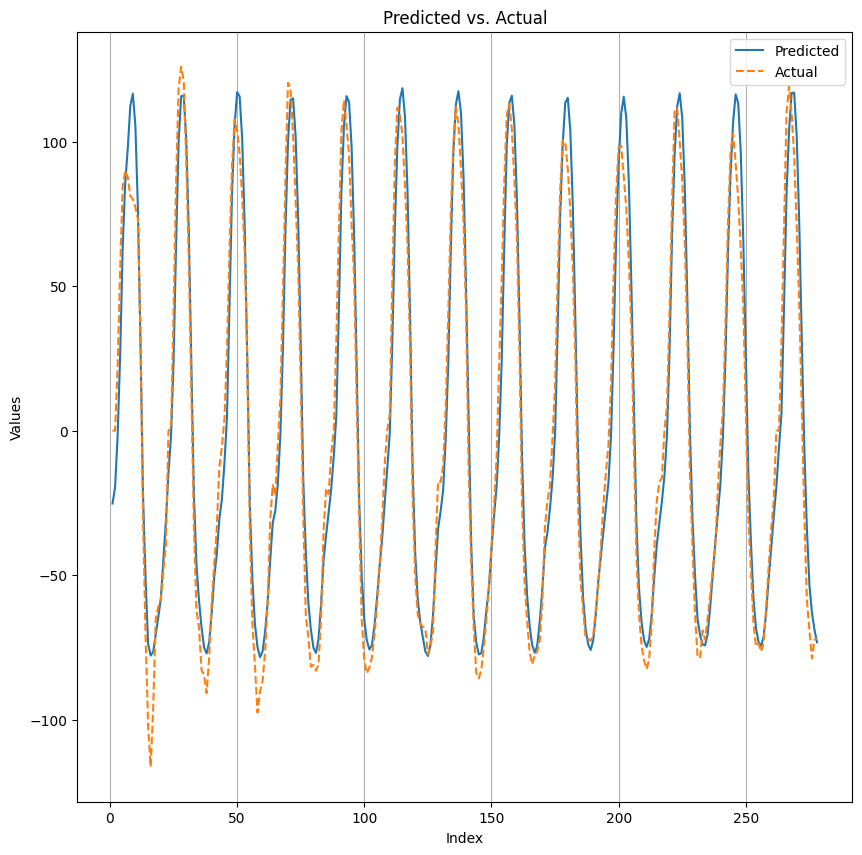

SCENE 13  TRAIN: [2890 2781 3498 ... 2445 1343 2242]  TEST: [3137 3138 3139 3140 3141 3142 3143 3144 3145 3146 3147 3148 3149 3150
 3151 3152 3153 3154 3155 3156 3157 3158 3159 3160 3161 3162 3163 3164
 3165 3166 3167 3168 3169 3170 3171 3172 3173 3174 3175 3176 3177 3178
 3179 3180 3181 3182 3183 3184 3185 3186 3187 3188 3189 3190 3191 3192
 3193 3194 3195 3196 3197 3198 3199 3200 3201 3202 3203 3204 3205 3206
 3207 3208 3209 3210 3211 3212 3213 3214 3215 3216 3217 3218 3219 3220
 3221 3222 3223 3224 3225 3226 3227 3228 3229 3230 3231 3232 3233 3234
 3235 3236 3237 3238 3239 3240 3241 3242 3243 3244 3245 3246 3247 3248
 3249 3250 3251 3252 3253 3254 3255 3256 3257 3258 3259 3260 3261 3262
 3263 3264 3265 3266 3267 3268 3269 3270 3271 3272 3273 3274 3275 3276
 3277 3278 3279 3280 3281 3282 3283 3284 3285 3286 3287 3288 3289 3290
 3291 3292 3293 3294 3295 3296 3297 3298 3299 3300 3301 3302 3303 3304
 3305 3306 3307 3308 3309 3310 3311 3312 3313 3314 3315 3316 3317 3318
 3319 3320 3321 3

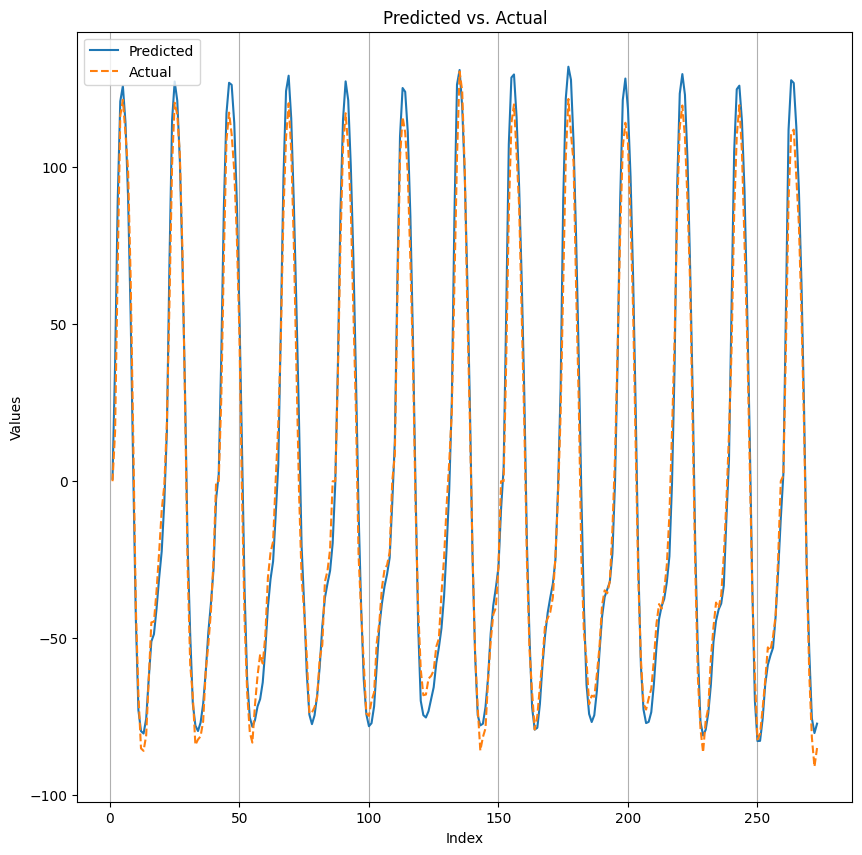

SCENE 14  TRAIN: [5403 3389  213 ... 1739 3773 5214]  TEST: [3410 3411 3412 3413 3414 3415 3416 3417 3418 3419 3420 3421 3422 3423
 3424 3425 3426 3427 3428 3429 3430 3431 3432 3433 3434 3435 3436 3437
 3438 3439 3440 3441 3442 3443 3444 3445 3446 3447 3448 3449 3450 3451
 3452 3453 3454 3455 3456 3457 3458 3459 3460 3461 3462 3463 3464 3465
 3466 3467 3468 3469 3470 3471 3472 3473 3474 3475 3476 3477 3478 3479
 3480 3481 3482 3483 3484 3485 3486 3487 3488 3489 3490 3491 3492 3493
 3494 3495 3496 3497 3498 3499 3500 3501 3502 3503 3504 3505 3506 3507
 3508 3509 3510 3511 3512 3513 3514 3515 3516 3517 3518 3519 3520 3521
 3522 3523 3524 3525 3526 3527 3528 3529 3530 3531 3532 3533 3534 3535
 3536 3537 3538 3539 3540 3541 3542 3543 3544 3545 3546 3547 3548 3549
 3550 3551 3552 3553 3554 3555 3556 3557 3558 3559 3560 3561 3562 3563
 3564 3565 3566 3567 3568 3569 3570 3571 3572 3573 3574 3575 3576 3577
 3578 3579 3580 3581 3582 3583 3584 3585 3586 3587 3588 3589 3590 3591
 3592 3593 3594 3

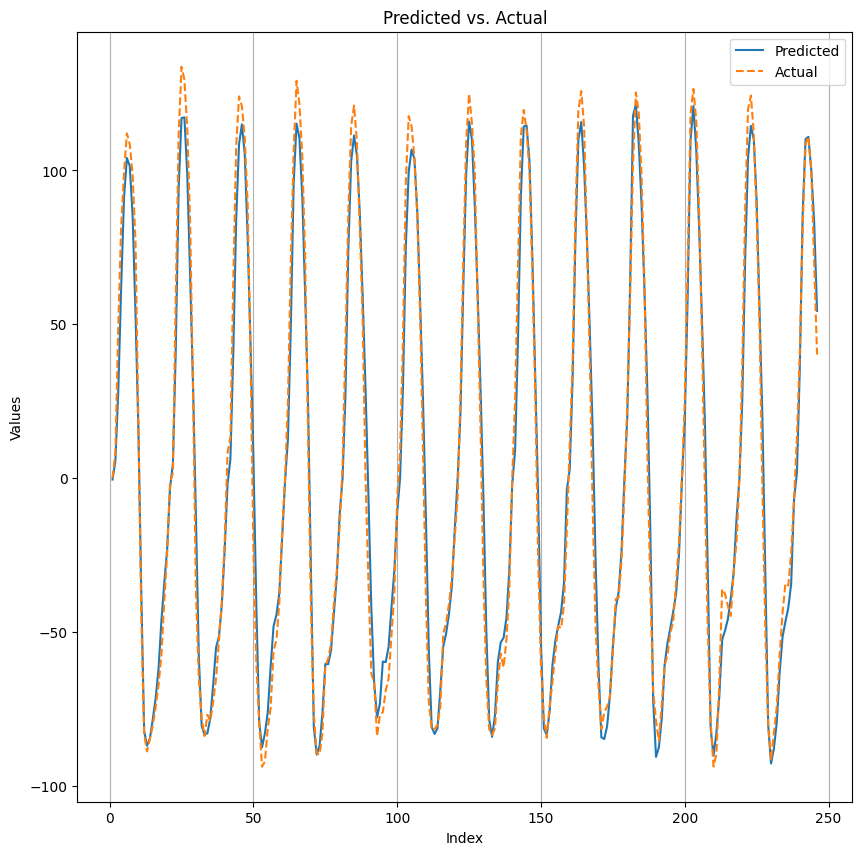

SCENE 15  TRAIN: [5419 3044 5227 ... 4346 1039 2976]  TEST: [3656 3657 3658 3659 3660 3661 3662 3663 3664 3665 3666 3667 3668 3669
 3670 3671 3672 3673 3674 3675 3676 3677 3678 3679 3680 3681 3682 3683
 3684 3685 3686 3687 3688 3689 3690 3691 3692 3693 3694 3695 3696 3697
 3698 3699 3700 3701 3702 3703 3704 3705 3706 3707 3708 3709 3710 3711
 3712 3713 3714 3715 3716 3717 3718 3719 3720 3721 3722 3723 3724 3725
 3726 3727 3728 3729 3730 3731 3732 3733 3734 3735 3736 3737 3738 3739
 3740 3741 3742 3743 3744 3745 3746 3747 3748 3749 3750 3751 3752 3753
 3754 3755 3756 3757 3758 3759 3760 3761 3762 3763 3764 3765 3766 3767
 3768 3769 3770 3771 3772 3773 3774 3775 3776 3777 3778 3779 3780 3781
 3782 3783 3784 3785 3786 3787 3788 3789 3790 3791 3792 3793 3794 3795
 3796 3797 3798 3799 3800 3801 3802 3803 3804 3805 3806 3807 3808 3809
 3810 3811 3812 3813 3814 3815 3816 3817 3818 3819 3820 3821 3822 3823
 3824 3825 3826 3827 3828 3829 3830 3831 3832 3833 3834 3835 3836 3837
 3838 3839 3840 3

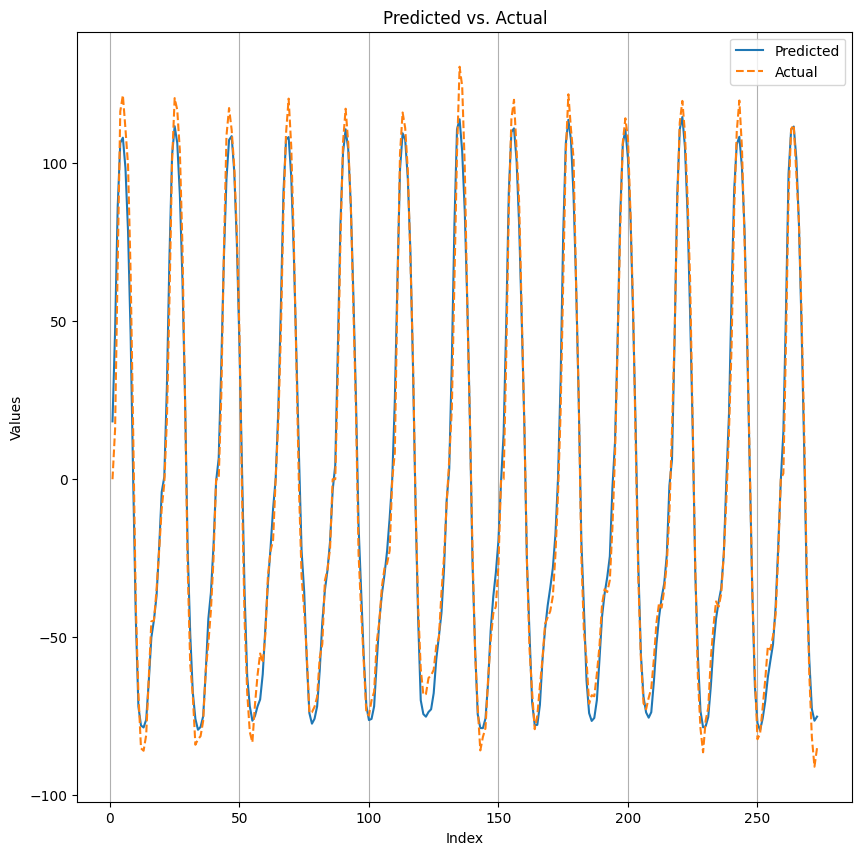

SCENE 16  TRAIN: [5266 2104  612 ...  439  626 3765]  TEST: [3929 3930 3931 3932 3933 3934 3935 3936 3937 3938 3939 3940 3941 3942
 3943 3944 3945 3946 3947 3948 3949 3950 3951 3952 3953 3954 3955 3956
 3957 3958 3959 3960 3961 3962 3963 3964 3965 3966 3967 3968 3969 3970
 3971 3972 3973 3974 3975 3976 3977 3978 3979 3980 3981 3982 3983 3984
 3985 3986 3987 3988 3989 3990 3991 3992 3993 3994 3995 3996 3997 3998
 3999 4000 4001 4002 4003 4004 4005 4006 4007 4008 4009 4010 4011 4012
 4013 4014 4015 4016 4017 4018 4019 4020 4021 4022 4023 4024 4025 4026
 4027 4028 4029 4030 4031 4032 4033 4034 4035 4036 4037 4038 4039 4040
 4041 4042 4043 4044 4045 4046 4047 4048 4049 4050 4051 4052 4053 4054
 4055 4056 4057 4058 4059 4060 4061 4062 4063 4064 4065 4066 4067 4068
 4069 4070 4071 4072 4073 4074 4075 4076 4077 4078 4079 4080 4081 4082
 4083 4084 4085 4086 4087 4088 4089 4090 4091 4092 4093 4094 4095 4096
 4097 4098 4099 4100 4101 4102 4103 4104 4105 4106 4107 4108 4109 4110
 4111 4112 4113 4

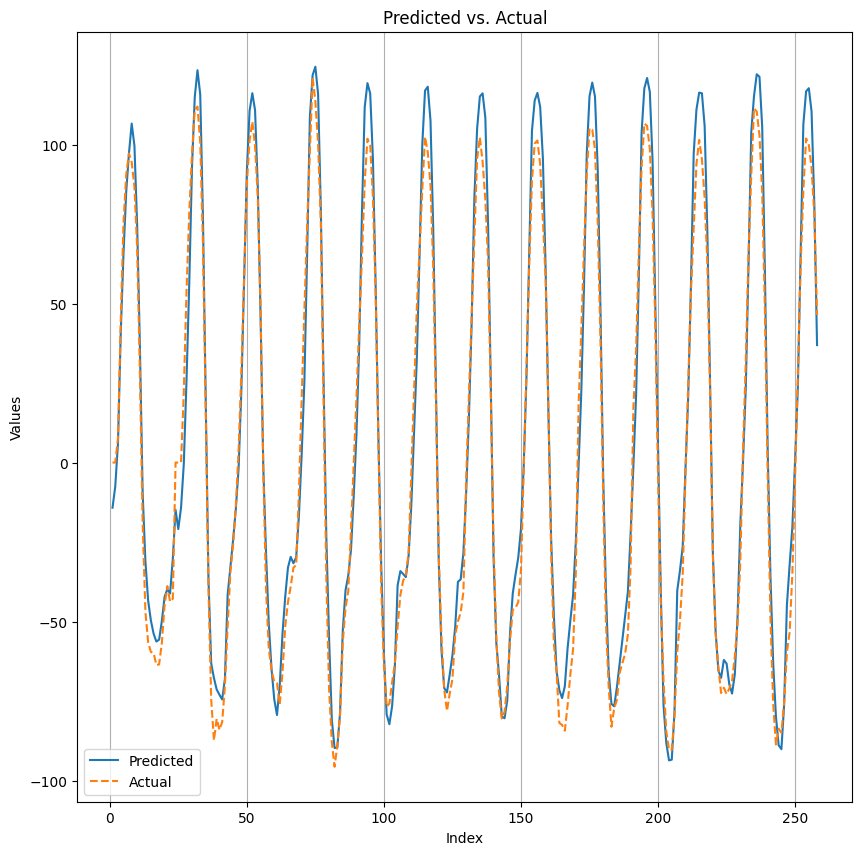

SCENE 17  TRAIN: [2311 2916 3312 ... 2633 3443 5296]  TEST: [4187 4188 4189 4190 4191 4192 4193 4194 4195 4196 4197 4198 4199 4200
 4201 4202 4203 4204 4205 4206 4207 4208 4209 4210 4211 4212 4213 4214
 4215 4216 4217 4218 4219 4220 4221 4222 4223 4224 4225 4226 4227 4228
 4229 4230 4231 4232 4233 4234 4235 4236 4237 4238 4239 4240 4241 4242
 4243 4244 4245 4246 4247 4248 4249 4250 4251 4252 4253 4254 4255 4256
 4257 4258 4259 4260 4261 4262 4263 4264 4265 4266 4267 4268 4269 4270
 4271 4272 4273 4274 4275 4276 4277 4278 4279 4280 4281 4282 4283 4284
 4285 4286 4287 4288 4289 4290 4291 4292 4293 4294 4295 4296 4297 4298
 4299 4300 4301 4302 4303 4304 4305 4306 4307 4308 4309 4310 4311 4312
 4313 4314 4315 4316 4317 4318 4319 4320 4321 4322 4323 4324 4325 4326
 4327 4328 4329 4330 4331 4332 4333 4334 4335 4336 4337 4338 4339 4340
 4341 4342 4343 4344 4345 4346 4347 4348 4349 4350 4351 4352 4353 4354
 4355 4356 4357 4358 4359 4360 4361 4362 4363 4364 4365 4366 4367 4368
 4369 4370 4371 4

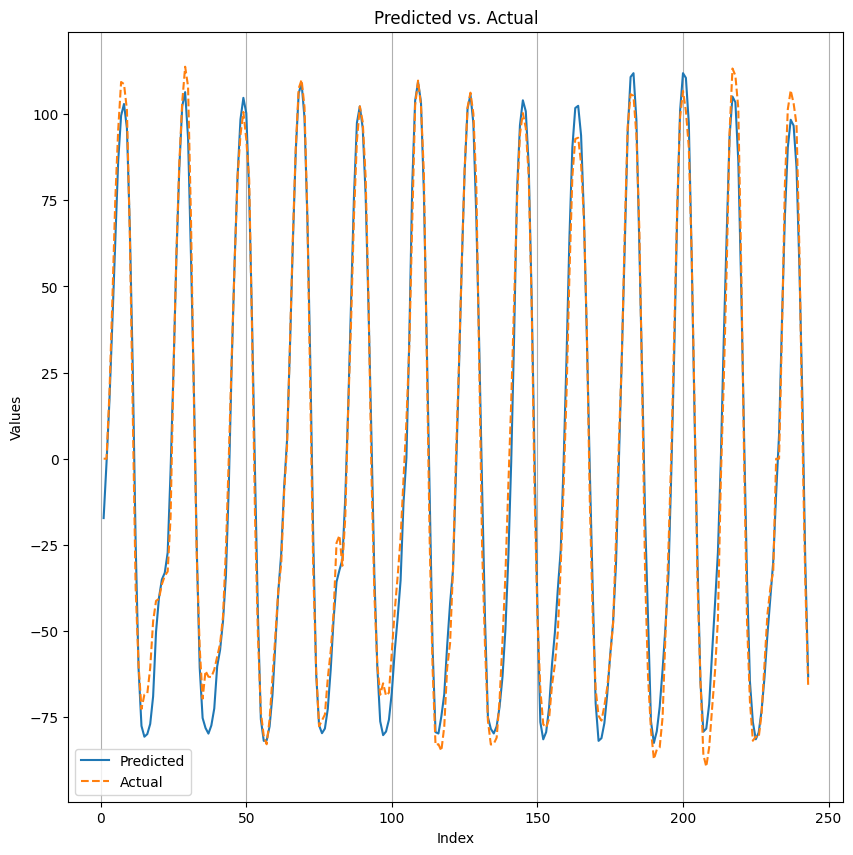

SCENE 18  TRAIN: [5467  422 2433 ... 1967 5256 3945]  TEST: [4430 4431 4432 4433 4434 4435 4436 4437 4438 4439 4440 4441 4442 4443
 4444 4445 4446 4447 4448 4449 4450 4451 4452 4453 4454 4455 4456 4457
 4458 4459 4460 4461 4462 4463 4464 4465 4466 4467 4468 4469 4470 4471
 4472 4473 4474 4475 4476 4477 4478 4479 4480 4481 4482 4483 4484 4485
 4486 4487 4488 4489 4490 4491 4492 4493 4494 4495 4496 4497 4498 4499
 4500 4501 4502 4503 4504 4505 4506 4507 4508 4509 4510 4511 4512 4513
 4514 4515 4516 4517 4518 4519 4520 4521 4522 4523 4524 4525 4526 4527
 4528 4529 4530 4531 4532 4533 4534 4535 4536 4537 4538 4539 4540 4541
 4542 4543 4544 4545 4546 4547 4548 4549 4550 4551 4552 4553 4554 4555
 4556 4557 4558 4559 4560 4561 4562 4563 4564 4565 4566 4567 4568 4569
 4570 4571 4572 4573 4574 4575 4576 4577 4578 4579 4580 4581 4582 4583
 4584 4585 4586 4587 4588 4589 4590 4591 4592 4593 4594 4595 4596 4597
 4598 4599 4600 4601 4602 4603 4604 4605 4606 4607 4608 4609 4610 4611
 4612 4613 4614 4

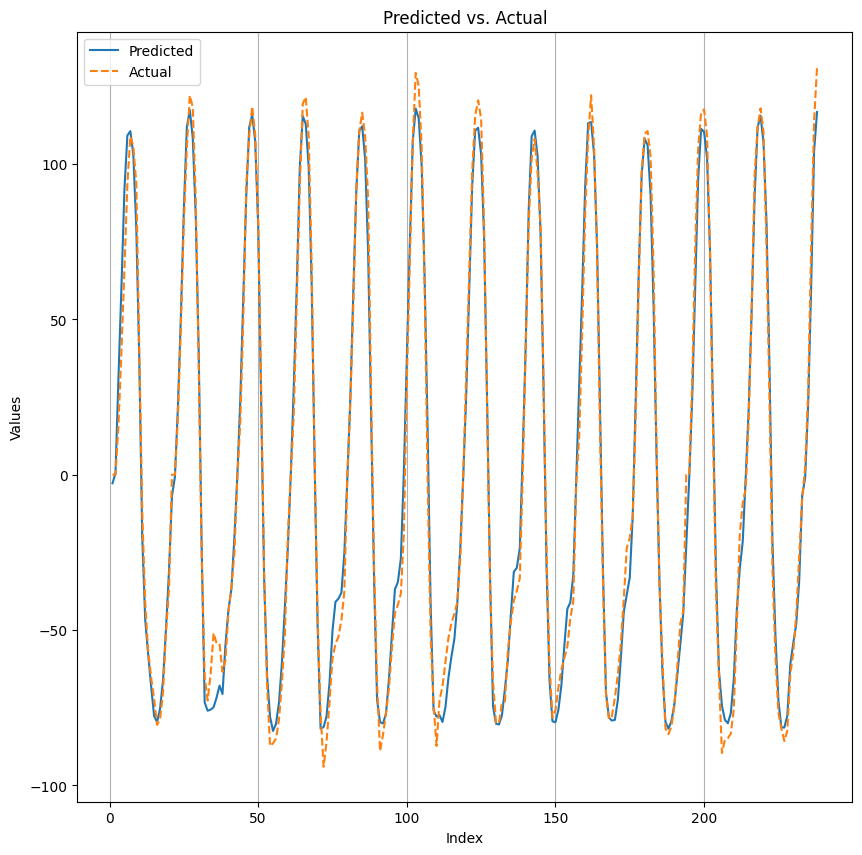

SCENE 19  TRAIN: [4179 5139 1414 ... 3081 4594 3414]  TEST: [4668 4669 4670 4671 4672 4673 4674 4675 4676 4677 4678 4679 4680 4681
 4682 4683 4684 4685 4686 4687 4688 4689 4690 4691 4692 4693 4694 4695
 4696 4697 4698 4699 4700 4701 4702 4703 4704 4705 4706 4707 4708 4709
 4710 4711 4712 4713 4714 4715 4716 4717 4718 4719 4720 4721 4722 4723
 4724 4725 4726 4727 4728 4729 4730 4731 4732 4733 4734 4735 4736 4737
 4738 4739 4740 4741 4742 4743 4744 4745 4746 4747 4748 4749 4750 4751
 4752 4753 4754 4755 4756 4757 4758 4759 4760 4761 4762 4763 4764 4765
 4766 4767 4768 4769 4770 4771 4772 4773 4774 4775 4776 4777 4778 4779
 4780 4781 4782 4783 4784 4785 4786 4787 4788 4789 4790 4791 4792 4793
 4794 4795 4796 4797 4798 4799 4800 4801 4802 4803 4804 4805 4806 4807
 4808 4809 4810 4811 4812 4813 4814 4815 4816 4817 4818 4819 4820 4821
 4822 4823 4824 4825 4826 4827 4828 4829 4830 4831 4832 4833 4834 4835
 4836 4837 4838 4839 4840 4841 4842 4843 4844 4845 4846 4847 4848 4849
 4850 4851 4852 4

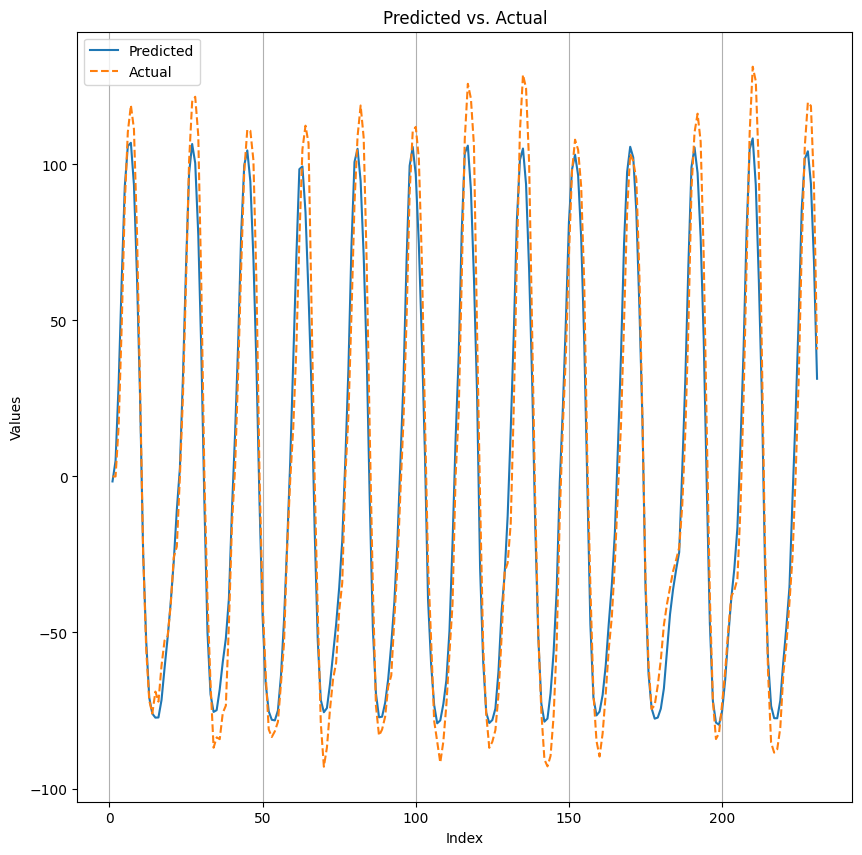

SCENE 20  TRAIN: [2938 5290 5239 ... 3225 3682 5157]  TEST: [4899 4900 4901 4902 4903 4904 4905 4906 4907 4908 4909 4910 4911 4912
 4913 4914 4915 4916 4917 4918 4919 4920 4921 4922 4923 4924 4925 4926
 4927 4928 4929 4930 4931 4932 4933 4934 4935 4936 4937 4938 4939 4940
 4941 4942 4943 4944 4945 4946 4947 4948 4949 4950 4951 4952 4953 4954
 4955 4956 4957 4958 4959 4960 4961 4962 4963 4964 4965 4966 4967 4968
 4969 4970 4971 4972 4973 4974 4975 4976 4977 4978 4979 4980 4981 4982
 4983 4984 4985 4986 4987 4988 4989 4990 4991 4992 4993 4994 4995 4996
 4997 4998 4999 5000 5001 5002 5003 5004 5005 5006 5007 5008 5009 5010
 5011 5012 5013 5014 5015 5016 5017 5018 5019 5020 5021 5022 5023 5024
 5025 5026 5027 5028 5029 5030 5031 5032 5033 5034 5035 5036 5037 5038]
Epoch 1/30
338/338 [==============================] - 11s 17ms/step - loss: 0.1199 - val_loss: 0.1606
Epoch 2/30
338/338 [==============================] - 5s 14ms/step - loss: 0.0672 - val_loss: 0.1058
Epoch 3/30
338/338 [======

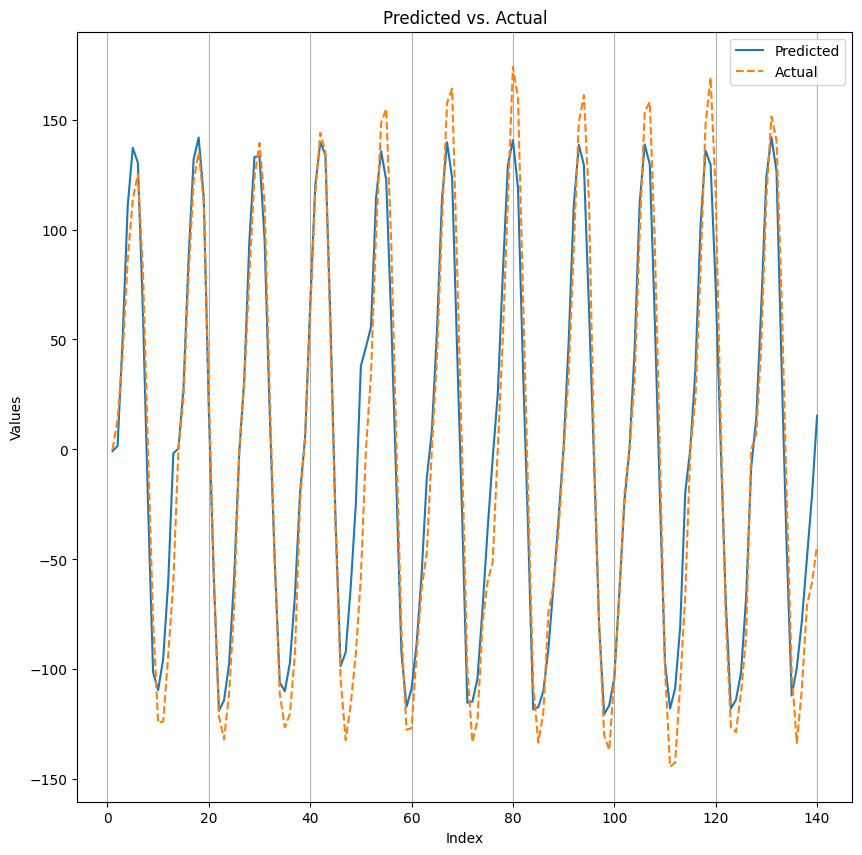

SCENE 21  TRAIN: [3433 4095  691 ... 3593 1549 4778]  TEST: [5039 5040 5041 5042 5043 5044 5045 5046 5047 5048 5049 5050 5051 5052
 5053 5054 5055 5056 5057 5058 5059 5060 5061 5062 5063 5064 5065 5066
 5067 5068 5069 5070 5071 5072 5073 5074 5075 5076 5077 5078 5079 5080
 5081 5082 5083 5084 5085 5086 5087 5088 5089 5090 5091 5092 5093 5094
 5095 5096 5097 5098 5099 5100 5101 5102 5103 5104 5105 5106 5107 5108
 5109 5110 5111 5112 5113 5114 5115 5116 5117 5118 5119 5120 5121 5122
 5123 5124 5125 5126 5127 5128 5129 5130 5131 5132 5133 5134 5135 5136
 5137 5138 5139 5140 5141 5142 5143 5144 5145 5146 5147 5148 5149 5150
 5151 5152 5153 5154 5155 5156 5157 5158 5159 5160 5161 5162 5163]
Epoch 1/30
339/339 [==============================] - 11s 17ms/step - loss: 0.1151 - val_loss: 0.2363
Epoch 2/30
339/339 [==============================] - 5s 14ms/step - loss: 0.0671 - val_loss: 0.1231
Epoch 3/30
339/339 [==============================] - 5s 15ms/step - loss: 0.0552 - val_loss: 0.0976
E

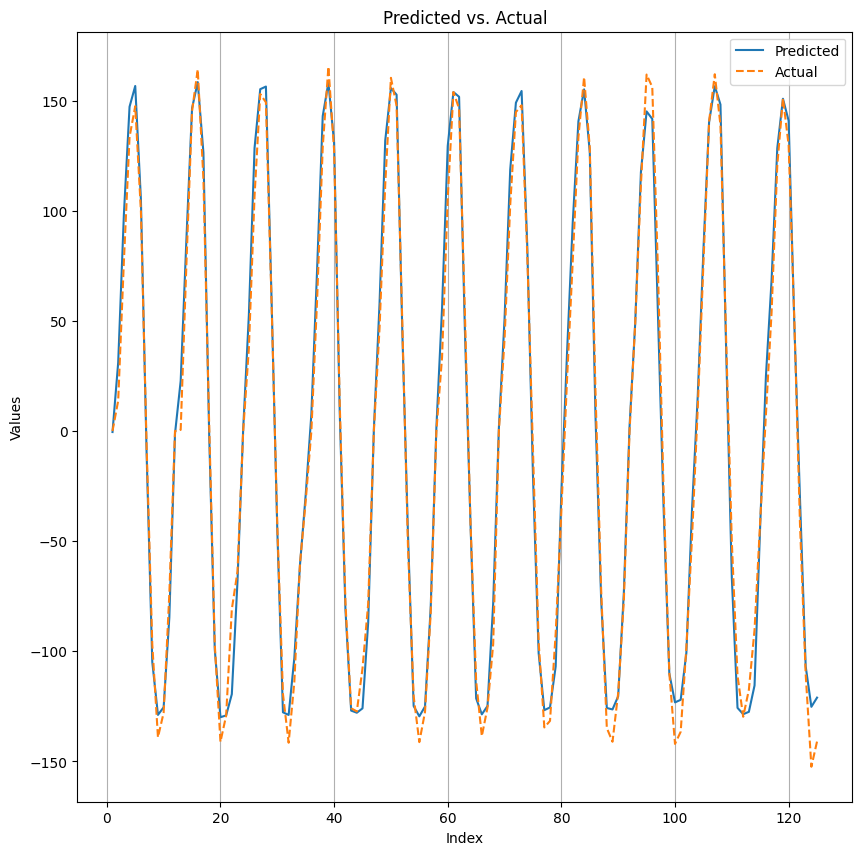

SCENE 22  TRAIN: [ 308 1941 3156 ... 3960 1553  170]  TEST: [5164 5165 5166 5167 5168 5169 5170 5171 5172 5173 5174 5175 5176 5177
 5178 5179 5180 5181 5182 5183 5184 5185 5186 5187 5188 5189 5190 5191
 5192 5193 5194 5195 5196 5197 5198 5199 5200 5201 5202 5203 5204 5205
 5206 5207 5208 5209 5210 5211 5212 5213 5214 5215 5216 5217 5218 5219
 5220 5221 5222 5223 5224 5225 5226 5227 5228 5229 5230 5231 5232 5233
 5234 5235 5236 5237 5238 5239 5240 5241 5242 5243 5244 5245 5246 5247
 5248 5249 5250 5251 5252 5253 5254 5255 5256 5257 5258 5259 5260 5261
 5262 5263 5264 5265 5266 5267 5268 5269 5270 5271 5272 5273 5274 5275
 5276 5277 5278 5279 5280 5281 5282 5283 5284 5285 5286 5287 5288]
Epoch 1/30
339/339 [==============================] - 11s 18ms/step - loss: 0.1012 - val_loss: 0.1853
Epoch 2/30
339/339 [==============================] - 5s 14ms/step - loss: 0.0586 - val_loss: 0.0963
Epoch 3/30
339/339 [==============================] - 4s 13ms/step - loss: 0.0462 - val_loss: 0.1134
E

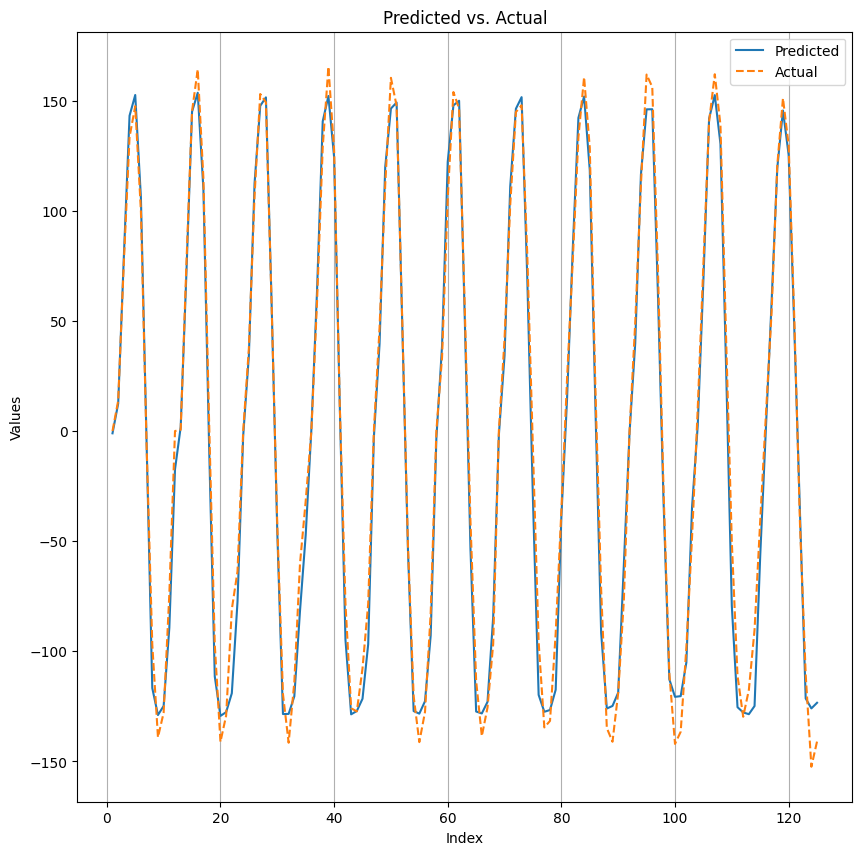

SCENE 23  TRAIN: [1285 1583 3473 ...   77 3674 4458]  TEST: [5289 5290 5291 5292 5293 5294 5295 5296 5297 5298 5299 5300 5301 5302
 5303 5304 5305 5306 5307 5308 5309 5310 5311 5312 5313 5314 5315 5316
 5317 5318 5319 5320 5321 5322 5323 5324 5325 5326 5327 5328 5329 5330
 5331 5332 5333 5334 5335 5336 5337 5338 5339 5340 5341 5342 5343 5344
 5345 5346 5347 5348 5349 5350 5351 5352 5353 5354 5355 5356 5357 5358
 5359 5360 5361 5362 5363 5364 5365 5366 5367 5368 5369 5370 5371 5372
 5373 5374 5375 5376 5377 5378 5379 5380 5381 5382 5383 5384 5385 5386
 5387 5388 5389 5390 5391 5392 5393 5394 5395 5396 5397 5398 5399 5400
 5401 5402 5403 5404 5405 5406 5407 5408 5409 5410 5411 5412 5413 5414
 5415 5416 5417 5418 5419 5420 5421 5422 5423 5424 5425 5426 5427 5428
 5429 5430 5431 5432 5433 5434 5435 5436 5437 5438 5439 5440 5441 5442
 5443 5444 5445 5446 5447 5448 5449 5450 5451 5452 5453 5454 5455 5456
 5457 5458 5459 5460 5461 5462 5463 5464 5465 5466 5467 5468 5469 5470
 5471 5472 5473 5

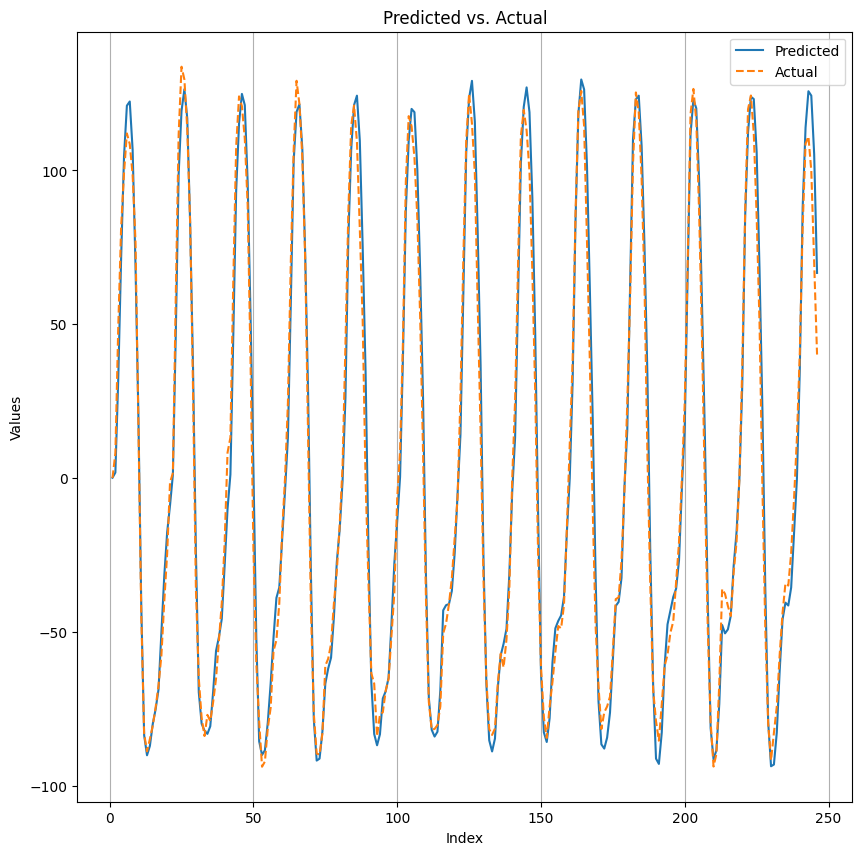

In [13]:
ResultadosRegressao(Resultados3Matrix[0],Resultados3Matrix[1],Resultados3Matrix[5])